# 데이터마이닝 - 프로젝트

## **0. 문제 설명**
가상의 통신 서비스를 이용 중인 고객 중 해지할 가능성이 있는 고객을 식별하는 문제. 고객 이탈은 고객 유지에 중요한 문제로, 이를 식별함으로써 고객 이탈을 최소화하고 고객 유지를 위한 의사결정을 지원할 수 있음



### **1) 데이터셋 개요**
*   전체 사용자 수: 5,000명의 사용자 데이터셋
*   이탈률: 약 14%의 사용자가 이탈 고객으로 분류됨
*   전화 행동과 이탈: 3회 이상 전화한 고객 중 50%가 이탈 고객으로 분류됨
*   이용 계획 유형과 이탈 :
  *   국제 통화 사용이 없는 고객 중 10%가 이탈
  *   국제 통화 사용이 있는 고객 중 8%가 이탈


### **2) 목표 변수**
*   target: 고객 이탈 여부(1: 이탈, 0: 이탈하지 않음)


### **3) 설명변수**
*   state: 고객이 거주하는 미국의 주(State)
*   account_length: 고객의 계정 유지 기간(일수)
*   area_code: 고객 전화번호의 지역 코드
*   international_plan: 국제 통화 이용 여부 (yes/no).
*   voice_mail_plan: 음성 메일 서비스 이용 여부 (yes/no)
*   number_vmail_messages: 음성 메일 메시지 수
*   total_day_minutes: 주간 통화 시간(분)
*   total_day_calls: 주간 통화 횟수
*   total_day_charge: 주간 통화 요금
*   total_eve_minutes: 저녁 통화 시간(분)
*   total_eve_calls: 저녁 통화 횟수
*   total_eve_charge: 저녁 통화 요금
*   total_night_minutes: 야간 통화 시간(분)
*   total_night_calls: 야간 통화 횟수
*   total_night_charge: 야간 통화 요금
*   total_intl_minutes: 국제 통화 시간(분)
*   total_intl_calls: 국제 통화 횟수
*   total_intl_charge: 국제 통화 요금
*   number_customer_service_calls: 고객 서비스 전화 횟수


### **4) 목표**
지도 학습 분류(machine learning) 알고리즘을 사용하여 예측 모델 개발하는 데 초점을 맞추고 있습니다. 주요 목표는 다음과 같습니다:

*   이탈할 가능성이 있는 고객을 예측하기 위한 모델 개발
*   이러한 모델의 정확성과 성능 평가
*   비즈니스에 가장 적합한 모델 식별하여 고객 이탈을 효과적으로 대응



---



## **1. Loading the Dataset**

In [1]:
import io
import openpyxl
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from matplotlib.colors import ListedColormap
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

In [2]:
df = pd.read_csv("dataset/churn.csv")
df.head()

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,target
0,KS,128,area_code_415,no,yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0
1,OH,107,area_code_415,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
2,NJ,137,area_code_415,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
3,OH,84,area_code_408,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
4,OK,75,area_code_415,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   state                          5000 non-null   object 
 1   account_length                 5000 non-null   int64  
 2   area_code                      5000 non-null   object 
 3   international_plan             5000 non-null   object 
 4   voice_mail_plan                5000 non-null   object 
 5   number_vmail_messages          5000 non-null   int64  
 6   total_day_minutes              5000 non-null   float64
 7   total_day_calls                5000 non-null   int64  
 8   total_day_charge               5000 non-null   float64
 9   total_eve_minutes              5000 non-null   float64
 10  total_eve_calls                5000 non-null   int64  
 11  total_eve_charge               5000 non-null   float64
 12  total_night_minutes            5000 non-null   f

In [4]:
# get the number of columns of each data type
print(f"""Number of:
float features: {len(df.select_dtypes('float').columns)}
int features: {len(df.select_dtypes('int').columns)}
object features: {len(df.select_dtypes('object').columns)}
""")

Number of:
float features: 8
int features: 8
object features: 4



In [5]:
df.describe()

,account_length,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,target
count,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,100.25860,7.755200,180.288900,100.029400,30.649668,200.636560,100.191000,17.054322,200.391620,99.919200,9.017732,10.261780,4.435200,2.771196,1.570400,0.141400
std,39.69456,13.546393,53.894699,19.831197,9.162069,50.551309,19.826496,4.296843,50.527789,19.958686,2.273763,2.761396,2.456788,0.745514,1.306363,0.348469
min,1.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,73.00000,0.000000,143.700000,87.000000,24.430000,166.375000,87.000000,14.140000,166.900000,87.000000,7.510000,8.500000,3.000000,2.300000,1.000000,0.000000
50%,100.00000,0.000000,180.100000,100.000000,30.620000,201.000000,100.000000,17.090000,200.400000,100.000000,9.020000,10.300000,4.000000,2.780000,1.000000,0.000000
75%,127.00000,17.000000,216.200000,113.000000,36.750000,234.100000,114.000000,19.900000,234.700000,113.000000,10.560000,12.000000,6.000000,3.240000,2.000000,0.000000
max,243.00000,52.000000,351.500000,165.000000,59.760000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000,1.000000


In [6]:
df.describe(include=["object", "bool"])

,state,area_code,international_plan,voice_mail_plan
count,5000,5000,5000,5000
unique,51,3,2,2
top,WV,area_code_415,no,no
freq,158,2495,4527,3677


In [7]:
df["target"].value_counts()

target
0    4293
1     707
Name: count, dtype: int64

In [8]:
df["target"].value_counts(normalize=True)

target
0    0.8586
1    0.1414
Name: proportion, dtype: float64



---



## **2. Data Preprocessing**

In [9]:
# check null values
df.isnull().sum()

state                            0
account_length                   0
area_code                        0
international_plan               0
voice_mail_plan                  0
number_vmail_messages            0
total_day_minutes                0
total_day_calls                  0
total_day_charge                 0
total_eve_minutes                0
total_eve_calls                  0
total_eve_charge                 0
total_night_minutes              0
total_night_calls                0
total_night_charge               0
total_intl_minutes               0
total_intl_calls                 0
total_intl_charge                0
number_customer_service_calls    0
target                           0
dtype: int64

In [10]:
# check uinique values
df.nunique()

state                              51
account_length                    218
area_code                           3
international_plan                  2
voice_mail_plan                     2
number_vmail_messages              48
total_day_minutes                1961
total_day_calls                   123
total_day_charge                 1961
total_eve_minutes                1879
total_eve_calls                   126
total_eve_charge                 1659
total_night_minutes              1853
total_night_calls                 131
total_night_charge               1028
total_intl_minutes                170
total_intl_calls                   21
total_intl_charge                 170
number_customer_service_calls      10
target                              2
dtype: int64

### **1) Issue 1**
'international_plan', 'voice_mail_plan' 컬럼 정수형으로 변환

In [11]:
# 'international_plan', 'voice_mail_plan' 컬럼 정수형으로 변환 (Yes/No -> 1/0)
df_encoded = pd.get_dummies(df, columns=['international_plan', 'voice_mail_plan'], drop_first=True)

# astype() 메서드를 사용하여 boolean을 정수형으로 변환 (Yes/No -> 1/0)
df_encoded['international_plan'] = df_encoded['international_plan_yes'].astype(int)
df_encoded['voice_mail_plan'] = df_encoded['voice_mail_plan_yes'].astype(int)
df_encoded.drop(columns=['international_plan_yes', 'voice_mail_plan_yes'], inplace=True)

# 결과 출력
df_encoded.head()

,state,account_length,area_code,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,target,international_plan,voice_mail_plan
0,KS,128,area_code_415,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0,0,1
1,OH,107,area_code_415,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0,0,1
2,NJ,137,area_code_415,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0,0,0
3,OH,84,area_code_408,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0,1,0
4,OK,75,area_code_415,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0,1,0


### **2) Issue 2**
'area_code' 컬럼 지역 번호만 추출

In [12]:
# 'area_code' 컬럼 지역 번호만 추출
df_encoded['area_code'] = df_encoded['area_code'].str.split('_').str[-1]
df_encoded.head()

,state,account_length,area_code,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,target,international_plan,voice_mail_plan
0,KS,128,415,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0,0,1
1,OH,107,415,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0,0,1
2,NJ,137,415,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0,0,0
3,OH,84,408,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0,1,0
4,OK,75,415,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0,1,0


### **3) Issue 3**
'total_minutes', 'total_calls', 'total_charge' 컬럼 추가

In [13]:
# 'total_minutes', 'total_calls', 'total_charge' 컬럼 추가
df["total_minutes"] = (df["total_day_minutes"] + df["total_eve_minutes"] + df["total_night_minutes"] + df["total_intl_minutes"])
df["total_calls"] = (df["total_day_calls"] + df["total_eve_calls"] + df["total_night_calls"] + df["total_intl_calls"])
df["total_charge"] = (df["total_day_charge"] + df["total_eve_charge"] + df["total_night_charge"] + df["total_intl_charge"])

df.head()

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,...,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,target,total_minutes,total_calls,total_charge
0,KS,128,area_code_415,no,yes,25,265.1,110,45.07,197.4,...,91,11.01,10.0,3,2.70,1,0,717.2,303,75.56
1,OH,107,area_code_415,no,yes,26,161.6,123,27.47,195.5,...,103,11.45,13.7,3,3.70,1,0,625.2,332,59.24
2,NJ,137,area_code_415,no,no,0,243.4,114,41.38,121.2,...,104,7.32,12.2,5,3.29,0,0,539.4,333,62.29
3,OH,84,area_code_408,yes,no,0,299.4,71,50.90,61.9,...,89,8.86,6.6,7,1.78,2,0,564.8,255,66.80
4,OK,75,area_code_415,yes,no,0,166.7,113,28.34,148.3,...,121,8.41,10.1,3,2.73,3,0,512.0,359,52.09




---



## **3. EDA**

### **1) Summary by class**

In [14]:
target_name = 'target'
class_names=['No', 'Yes'] #(0 = no, 1=yes)
feature_names=['account_length',
               'international_plan',
               'voice_mail_plan',
               'number_vmail_messages',
               'total_day_minutes',
               'total_day_calls',
               'total_day_charge',
               'total_eve_minutes',
               'total_eve_calls',
               'total_eve_charge',
               'total_night_minutes',
               'total_night_calls',
               'total_night_charge',
               'total_intl_minutes',
               'total_intl_calls',
               'total_intl_charge',
               'number_customer_service_calls'
              #  'total_minutes',
              #  'total_calls',
              #  'total_charge'
               ]

#### **(1) 설명변수별 평균**

In [15]:
# 수치형 변수만 선택
numeric_df = df_encoded.select_dtypes(include=['number'])

In [16]:
# 설명변수별 평균
numeric_df.groupby("target").mean()

,account_length,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,international_plan,voice_mail_plan
target,,,,,,,,,,,,,,,,,
0,99.917074,8.291870,175.746564,99.899604,29.877494,198.805031,100.241556,16.898654,199.455113,99.975775,8.975593,10.190869,4.481947,2.752055,1.457722,0.063825,0.284416
1,102.332390,4.496464,207.870580,100.817539,35.338416,211.757850,99.884017,17.999562,206.078218,99.575672,9.273607,10.692362,4.151344,2.887426,2.254597,0.281471,0.144272


#### **(2) 시간대별 평균**

In [17]:
# 시간대별 통화 시간
columns_to_show = ["total_day_minutes", "total_eve_minutes", "total_night_minutes"]
df.groupby(["target"])[columns_to_show].describe(percentiles=[])

total_day_minutes                                            \
                   count        mean        std  min    50%    max   
target                                                               
0                 4293.0  175.746564  49.634575  0.0  178.0  315.6   
1                  707.0  207.870580  68.576475  0.0  215.9  351.5   

       total_eve_minutes                                             \
                   count        mean        std   min    50%    max   
target                                                                
0                 4293.0  198.805031  50.151854   0.0  199.5  361.8   
1                  707.0  211.757850  51.568859  70.9  211.1  363.7   

       total_night_minutes                                             
                     count        mean        std   min    50%    max  
target                                                                 
0                   4293.0  199.455113  50.609570   0.0  199.0  395.0  
1                    707.0  206.078218  49.685763  47.4  206.3  381.6

In [18]:
# 시간대별 통화 건수
columns_to_show = ["total_day_calls", "total_eve_calls", "total_night_calls"]
df.groupby(["target"])[columns_to_show].describe(percentiles=[])

total_day_calls                                            \
                 count        mean        std  min    50%    max   
target                                                             
0               4293.0   99.899604  19.674019  0.0  100.0  163.0   
1                707.0  100.817539  20.757110  0.0  101.0  165.0   

       total_eve_calls                                             \
                 count        mean        std   min    50%    max   
target                                                              
0               4293.0  100.241556  19.862391   0.0  101.0  170.0   
1                707.0   99.884017  19.618258  48.0   99.0  168.0   

       total_night_calls                                            
                   count       mean        std   min    50%    max  
target                                                              
0                 4293.0  99.975775  19.958820   0.0  100.0  175.0  
1                  707.0  99.575672  19.968555  42.0  100.0  158.0

In [19]:
# 시간대별 통화 요금
columns_to_show = ["total_day_charge", "total_eve_charge", "total_night_charge"]
df.groupby(["target"])[columns_to_show].describe(percentiles=[])

total_day_charge                                           \
                  count       mean        std  min    50%    max   
target                                                             
0                4293.0  29.877494   8.437810  0.0  30.26  53.65   
1                 707.0  35.338416  11.658195  0.0  36.70  59.76   

       total_eve_charge                                           \
                  count       mean       std   min    50%    max   
target                                                             
0                4293.0  16.898654  4.262900  0.00  16.96  30.75   
1                 707.0  17.999562  4.383293  6.03  17.94  30.91   

       total_night_charge                                         
                    count      mean       std   min   50%    max  
target                                                            
0                  4293.0  8.975593  2.277438  0.00  8.96  17.77  
1                   707.0  9.273607  2.235902  2.13  9.28  17.17

total_day_minutes      180.28890
total_eve_minutes      200.63656
total_night_minutes    200.39162
total_minutes          591.57886
dtype: float64
total_day_calls      100.0294
total_eve_calls      100.1910
total_night_calls     99.9192
total_calls          304.5748
dtype: float64
total_day_charge      30.649668
total_eve_charge      17.054322
total_night_charge     9.017732
total_charge          59.492918
dtype: float64


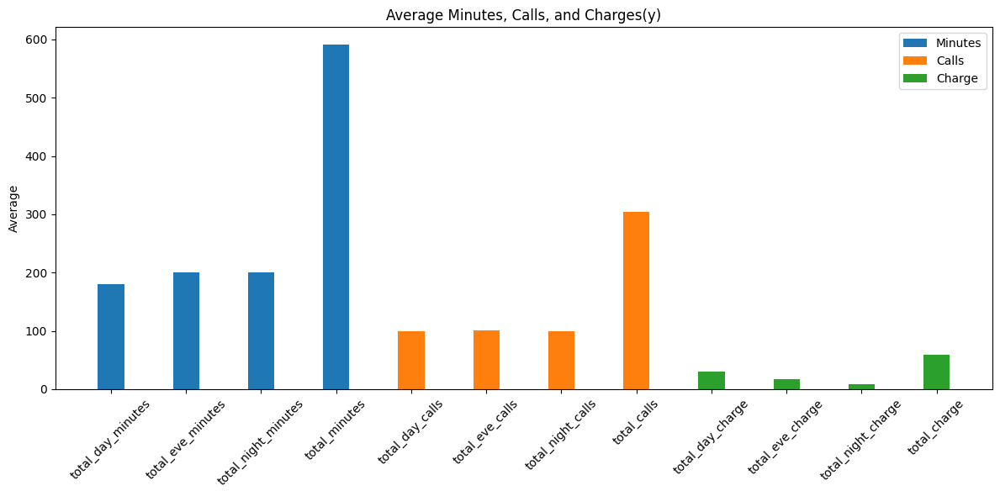

In [20]:
# Visualization
# 1) target 전체 데이터
# 각 그룹별 평균 계산
columns_to_show_minutes = ["total_day_minutes", "total_eve_minutes", "total_night_minutes", "total_minutes"]
columns_to_show_calls = ["total_day_calls", "total_eve_calls", "total_night_calls", "total_calls"]
columns_to_show_charge = ["total_day_charge", "total_eve_charge", "total_night_charge", "total_charge"]

mean_minutes = df[columns_to_show_minutes].mean()
mean_calls = df[columns_to_show_calls].mean()
mean_charge = df[columns_to_show_charge].mean()
print(mean_minutes)
print(mean_calls)
print(mean_charge)

# 하나의 그래프에 묶어서 그리기
fig, ax = plt.subplots(figsize=(12, 6))

index = range(len(columns_to_show_minutes) + len(columns_to_show_calls) + len(columns_to_show_charge))
bar_width = 0.35

# Plot minutes
ax.bar(index[:len(columns_to_show_minutes)], mean_minutes, bar_width, label='Minutes')

# Plot calls
ax.bar(index[len(columns_to_show_minutes):len(columns_to_show_minutes) + len(columns_to_show_calls)],
       mean_calls, bar_width, label='Calls')

# Plot charge
ax.bar(index[len(columns_to_show_minutes) + len(columns_to_show_calls):],
       mean_charge, bar_width, label='Charge')

# X-axis labels
ax.set_xticks(index)
ax.set_xticklabels(columns_to_show_minutes + columns_to_show_calls + columns_to_show_charge, rotation=45)

ax.set_ylabel('Average')
ax.set_title('Average Minutes, Calls, and Charges(y)')
ax.legend()

plt.tight_layout()
plt.show()

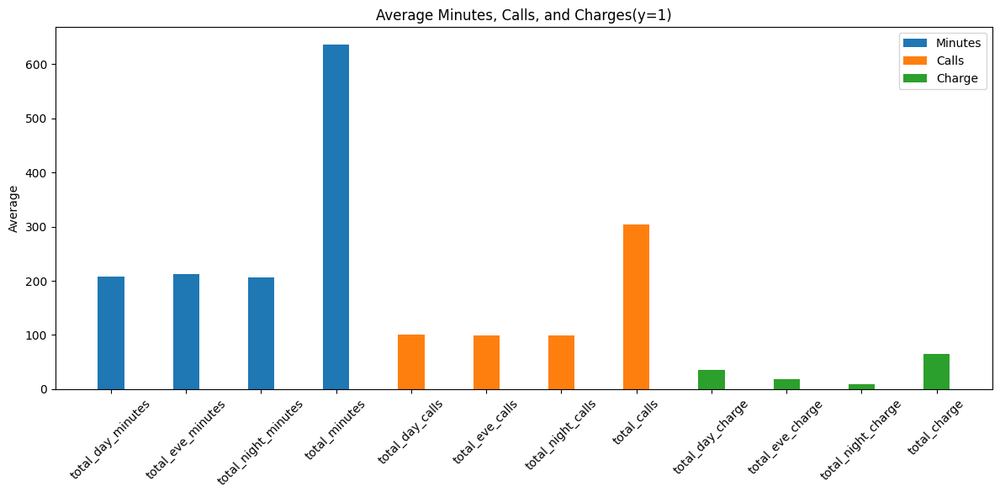

In [21]:
# 2) target=1(이탈 고객) 데이터
df_target_1 = df[df["target"] == 1]

# 각 그룹별 평균 계산
columns_to_show_minutes = ["total_day_minutes", "total_eve_minutes", "total_night_minutes", "total_minutes"]
columns_to_show_calls = ["total_day_calls", "total_eve_calls", "total_night_calls", "total_calls"]
columns_to_show_charge = ["total_day_charge", "total_eve_charge", "total_night_charge", "total_charge"]

mean_minutes = df_target_1[columns_to_show_minutes].mean()
mean_calls = df_target_1[columns_to_show_calls].mean()
mean_charge = df_target_1[columns_to_show_charge].mean()

# 하나의 그래프에 묶어서 그리기
fig, ax = plt.subplots(figsize=(12, 6))

index = range(len(columns_to_show_minutes) + len(columns_to_show_calls) + len(columns_to_show_charge))
bar_width = 0.35

# Plot minutes
ax.bar(index[:len(columns_to_show_minutes)], mean_minutes, bar_width, label='Minutes')

# Plot calls
ax.bar(index[len(columns_to_show_minutes):len(columns_to_show_minutes) + len(columns_to_show_calls)],
       mean_calls, bar_width, label='Calls')

# Plot charge
ax.bar(index[len(columns_to_show_minutes) + len(columns_to_show_calls):],
       mean_charge, bar_width, label='Charge')

# X-axis labels
ax.set_xticks(index)
ax.set_xticklabels(columns_to_show_minutes + columns_to_show_calls + columns_to_show_charge, rotation=45)

ax.set_ylabel('Average')
ax.set_title('Average Minutes, Calls, and Charges(y=1)')
ax.legend()

plt.tight_layout()
plt.show()

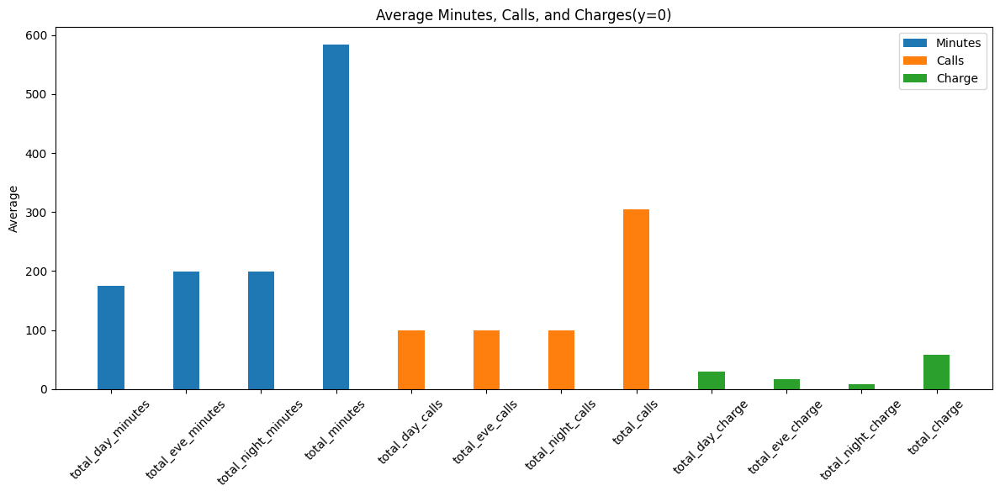

In [22]:
# 3) target=0(이탈하지 않은 고객) 데이터
df_target_0 = df[df["target"] == 0]

# 각 그룹별 평균 계산
columns_to_show_minutes = ["total_day_minutes", "total_eve_minutes", "total_night_minutes", "total_minutes"]
columns_to_show_calls = ["total_day_calls", "total_eve_calls", "total_night_calls", "total_calls"]
columns_to_show_charge = ["total_day_charge", "total_eve_charge", "total_night_charge", "total_charge"]

mean_minutes = df_target_0[columns_to_show_minutes].mean()
mean_calls = df_target_0[columns_to_show_calls].mean()
mean_charge = df_target_0[columns_to_show_charge].mean()

# 하나의 그래프에 묶어서 그리기
fig, ax = plt.subplots(figsize=(12, 6))

index = range(len(columns_to_show_minutes) + len(columns_to_show_calls) + len(columns_to_show_charge))
bar_width = 0.35

# Plot minutes
ax.bar(index[:len(columns_to_show_minutes)], mean_minutes, bar_width, label='Minutes')

# Plot calls
ax.bar(index[len(columns_to_show_minutes):len(columns_to_show_minutes) + len(columns_to_show_calls)],
       mean_calls, bar_width, label='Calls')

# Plot charge
ax.bar(index[len(columns_to_show_minutes) + len(columns_to_show_calls):],
       mean_charge, bar_width, label='Charge')

# X-axis labels
ax.set_xticks(index)
ax.set_xticklabels(columns_to_show_minutes + columns_to_show_calls + columns_to_show_charge, rotation=45)

ax.set_ylabel('Average')
ax.set_title('Average Minutes, Calls, and Charges(y=0)')
ax.legend()

plt.tight_layout()
plt.show()

#### **(3) 주별 평균**

In [23]:
# 주별 통화 시간
df.pivot_table(
    ["total_day_minutes", "total_eve_minutes", "total_night_minutes"],
    ["state"],
    aggfunc="mean",
)

,total_day_minutes,total_eve_minutes,total_night_minutes
state,,,
AK,180.958333,189.683333,197.870833
AL,189.474194,199.669355,187.160484
AR,175.185870,197.918478,205.045652
AZ,176.457303,195.919101,191.632584
CA,172.932692,194.632692,199.767308
CO,176.411458,204.292708,188.827083
CT,175.576768,201.148485,202.327273
DC,172.423864,197.865909,210.781818
DE,183.543617,206.446809,206.054255


In [24]:
# 주별 통화 건수
df.pivot_table(
    ["total_day_calls", "total_eve_calls", "total_night_calls"],
    ["state"],
    aggfunc="mean",
)

,total_day_calls,total_eve_calls,total_night_calls
state,,,
AK,99.541667,98.986111,99.111111
AL,99.129032,97.596774,98.177419
AR,99.923913,98.445652,101.206522
AZ,100.056180,101.348315,99.955056
CA,102.538462,101.153846,96.096154
CO,97.906250,99.906250,95.781250
CT,97.979798,98.929293,102.040404
DC,101.000000,101.318182,102.102273
DE,98.095745,96.712766,98.468085


In [25]:
# 주별 통화 요금
df.pivot_table(
    ["total_day_charge", "total_eve_charge", "total_night_charge"],
    ["state"],
    aggfunc="mean",
)

,total_day_charge,total_eve_charge,total_night_charge
state,,,
AK,30.763333,16.122917,8.904028
AL,32.210887,16.972097,8.422419
AR,29.782065,16.823370,9.227283
AZ,29.998315,16.653258,8.623820
CA,29.399038,16.544423,8.989615
CO,29.990521,17.364792,8.497917
CT,29.848384,17.097980,9.105152
DC,29.313068,16.819205,9.485341
DE,31.203085,17.548511,9.272660


In [26]:
# Visualization
!pip install geopandas matplotlib pandas

In [27]:
import geopandas as gpd

In [28]:
def plot_us_state_data(data, value_column, title, cmap='OrRd'):
    """
    미국 주별 데이터를 지도에 시각화하는 함수

    Parameters:
    - data: pandas DataFrame, 주 데이터를 포함한 데이터프레임 (state 컬럼 포함)
    - value_column: str, 시각화할 값의 컬럼명
    - title: str, 지도 제목
    - cmap: str, 컬러맵 이름 (기본값은 'OrRd')
    """
    # 주별 value_column의 평균 계산
    state_mean = data.pivot_table([value_column], ["state"], aggfunc="mean").reset_index()

    # 미국 주 shapefile 로드
    us_states = gpd.read_file("https://www2.census.gov/geo/tiger/GENZ2021/shp/cb_2021_us_state_20m.zip")

    # 주 이름 약어로 변환
    us_states['state'] = us_states['STUSPS']

    # 주 데이터를 us_states와 병합
    merged = us_states.set_index('state').join(state_mean.set_index('state'))

    # 주별 평균 값을 컬러맵으로 시각화
    fig, ax = plt.subplots(1, 1, figsize=(15, 10))
    merged.plot(column=value_column, ax=ax, legend=True, cmap=cmap,
                legend_kwds={'label': f"Average {value_column.replace('_', ' ').title()} by State",
                             'orientation': "horizontal"})

    # 주별 약어 추가
    for idx, row in merged.iterrows():
        plt.text(row['geometry'].centroid.x, row['geometry'].centroid.y, row.name,
                 horizontalalignment='center', fontsize=6, color='black')

    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

    plt.title(title)
    plt.show()

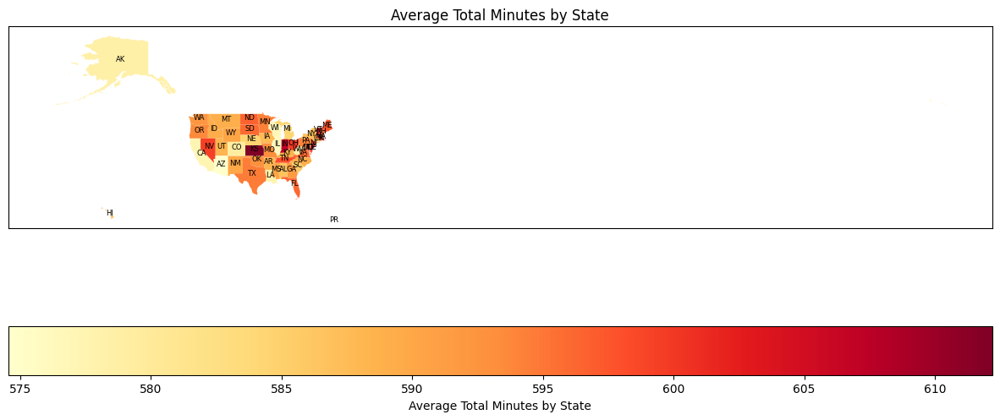

   state  total_minutes
16    KS     612.180808
15    IN     607.214286
8     DE     606.651064
46    VT     605.708911
31    NJ     603.505357
19    MA     600.755340
35    OH     599.975000
33    NV     599.360000
39    RI     598.961616
42    TN     598.125843
20    MD     597.740196
21    ME     597.612621
28    ND     596.582955
9     FL     596.123333
45    VA     596.040678
41    SD     595.920000
30    NH     595.588421
43    TX     594.591379
23    MN     594.368000
38    PA     594.058442
37    OR     593.522807
24    MO     592.984946
36    OK     592.703333
47    WA     592.239796
10    GA     591.709639
7     DC     591.586364
50    WY     590.421739
25    MS     590.352525
32    NM     589.869231
6     CT     589.428283
13    ID     589.273950
27    NC     589.117582
26    MT     589.008081
17    KY     588.724242
2     AR     588.301087
44    UT     588.299107
12    IA     587.547826
11    HI     587.368605
34    NY     587.076316
1     AL     586.716935
40    SC     585

In [29]:
# 주별 통화 시간
state_minutes_mean = df.pivot_table(
    ["total_minutes"],
    ["state"],
    aggfunc="mean",
).reset_index()

plot_us_state_data(state_minutes_mean, "total_minutes", "Average Total Minutes by State", "YlOrRd")

# sort
state_minutes_mean = state_minutes_mean.sort_values(by="total_minutes", ascending=False)
print(state_minutes_mean)

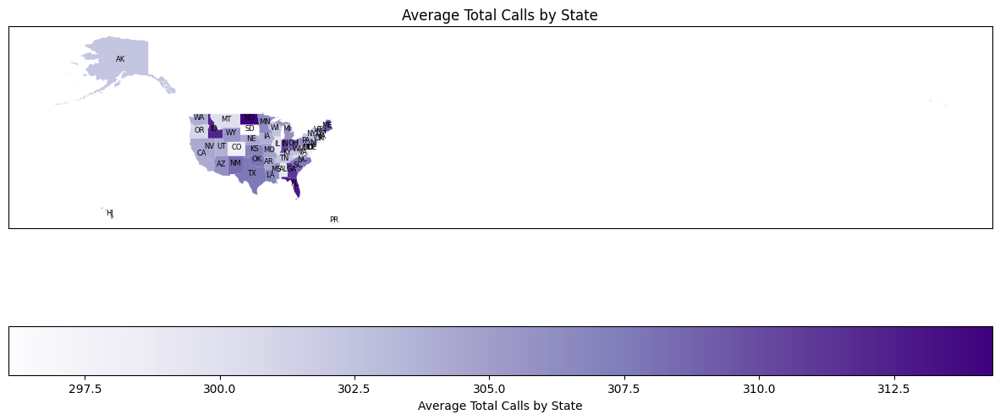

   state  total_calls
28    ND   314.318182
9     FL   313.033333
13    ID   312.252101
10    GA   311.156627
15    IN   310.479592
21    ME   309.485437
35    OH   309.293103
40    SC   308.648352
7     DC   308.386364
32    NM   308.362637
31    NJ   307.937500
36    OK   307.911111
11    HI   307.837209
43    TX   307.655172
27    NC   307.571429
18    LA   307.097561
16    KS   306.919192
23    MN   306.432000
3     AZ   306.112360
38    PA   306.064935
25    MS   305.989899
22    MI   305.970874
50    WY   305.600000
46    VT   305.287129
24    MO   304.709677
33    NV   304.400000
2     AR   304.326087
29    NE   304.318182
4     CA   304.134615
12    IA   303.884058
47    WA   303.846939
44    UT   303.803571
6     CT   303.020202
49    WV   302.962025
17    KY   302.797980
42    TN   302.483146
48    WI   302.377358
34    NY   302.350877
0     AK   302.291667
37    OR   300.973684
26    MT   300.202020
45    VA   300.067797
30    NH   299.747368
1     AL   299.403226
14    IL  

In [30]:
# 주별 통화 건수
state_calls_mean = df.pivot_table(
    ["total_calls"],
    ["state"],
    aggfunc="mean",
).reset_index()

plot_us_state_data(state_calls_mean, "total_calls", "Average Total Calls by State", "Purples")

# sort
state_calls_mean = state_calls_mean.sort_values(by="total_calls", ascending=False)
print(state_calls_mean)

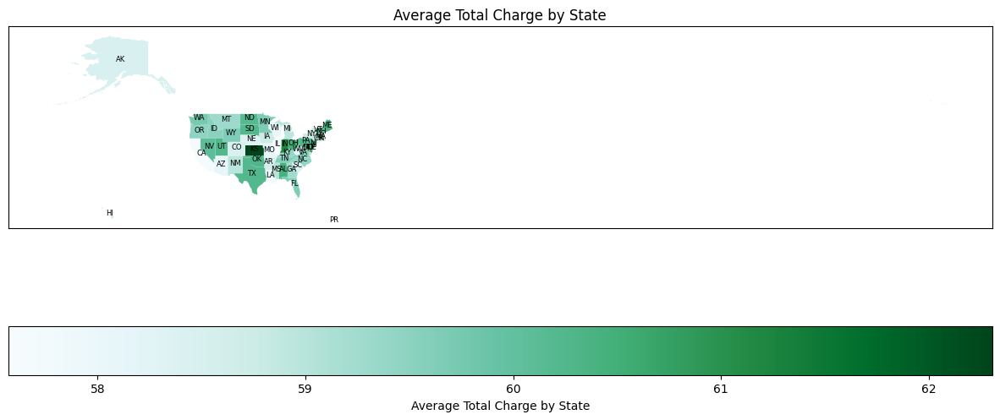

   state  total_charge
16    KS     62.303636
31    NJ     61.425446
15    IN     61.214388
20    MD     61.023627
8     DE     60.889255
19    MA     60.590971
35    OH     60.518966
46    VT     60.458218
1     AL     60.417097
21    ME     60.391748
36    OK     60.282667
44    UT     60.260893
38    PA     60.252338
41    SD     60.250471
43    TX     60.216121
28    ND     60.178295
33    NV     60.091111
47    WA     59.734796
23    MN     59.695120
50    WY     59.649739
9     FL     59.624667
42    TN     59.611348
45    VA     59.565169
13    ID     59.526050
37    OR     59.475000
27    NC     59.432198
17    KY     59.368889
39    RI     59.319899
26    MT     59.302929
30    NH     59.273579
10    GA     59.261687
25    MS     58.997778
32    NM     58.972747
22    MI     58.953107
6     CT     58.853030
11    HI     58.787558
34    NY     58.748246
12    IA     58.746667
2     AR     58.573587
5     CO     58.494063
0     AK     58.459028
7     DC     58.457386
40    SC   

In [31]:
# 주별 통화 요금
state_charge_mean = df.pivot_table(
    ["total_charge"],
    ["state"],
    aggfunc="mean",
).reset_index()

plot_us_state_data(state_charge_mean, "total_charge", "Average Total Charge by State", "BuGn")

# sort
state_charge_mean = state_charge_mean.sort_values(by="total_charge", ascending=False)
print(state_charge_mean)

#### **(4) 주별 이탈 고객 수**

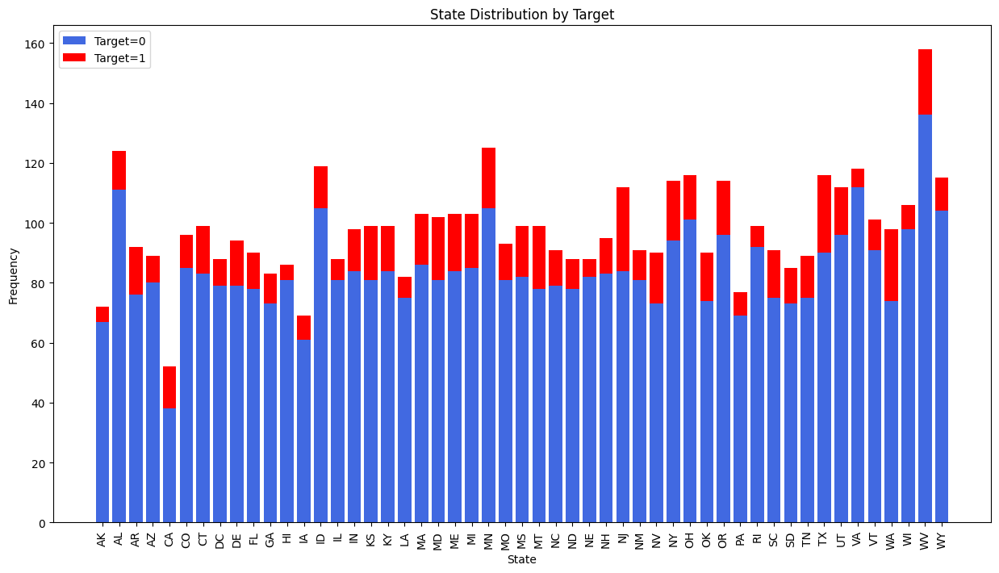

In [32]:
# Visualization
# 각 state별 target 빈도수 계산
state_counts = df.groupby('state')[target_name].value_counts().unstack(fill_value=0)
state_target0 = state_counts[0]
state_target1 = state_counts[1]

# Visualization
plt.figure(figsize=(15, 8))
plt.bar(state_counts.index, state_target0, label='Target=0', color='royalblue')
plt.bar(state_counts.index, state_target1, bottom=state_target0, label='Target=1', color='red')

plt.title('State Distribution by Target')
plt.xlabel('State')
plt.ylabel('Frequency')
plt.xticks(rotation=90)
plt.legend()
plt.show()

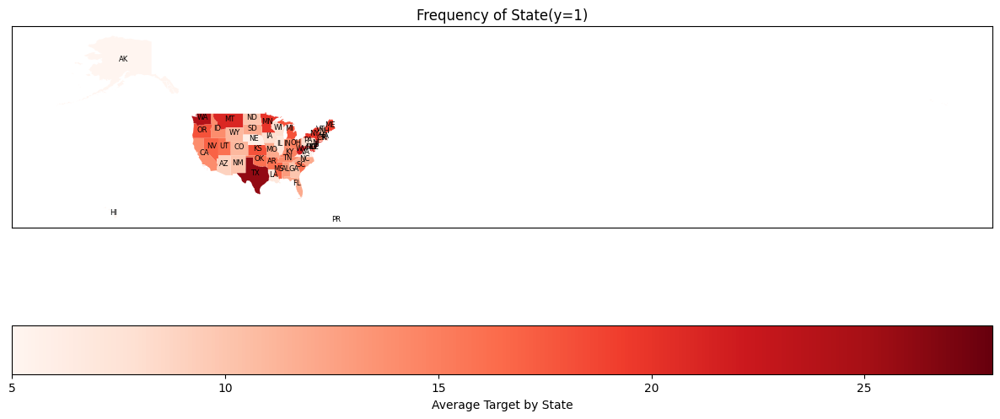

   state  target
0     NJ      28
1     TX      26
2     WA      24
3     WV      22
4     MT      21
5     MD      21
6     MN      20
7     NY      20
8     ME      19
9     KS      18
10    OR      18
11    MI      18
14    NV      17
12    MS      17
13    MA      17
15    SC      16
16    UT      16
17    OK      16
18    CT      16
19    AR      16
20    KY      15
21    DE      15
22    OH      15
26    ID      14
25    IN      14
24    CA      14
23    TN      14
27    AL      13
28    NH      12
29    FL      12
30    SD      12
31    MO      12
32    NC      12
33    WY      11
34    CO      11
37    GA      10
38    VT      10
36    ND      10
35    NM      10
39    DC       9
40    AZ       9
41    WI       8
42    PA       8
43    IA       8
44    IL       7
45    LA       7
46    RI       7
47    VA       6
48    NE       6
49    AK       5
50    HI       5


In [33]:
# 1) target=1(이탈 고객) 데이터
state_counts = df[df["target"] == 1]["state"].value_counts().reset_index()
state_counts.columns = ["state", "target"]

plot_us_state_data(state_counts, "target", "Frequency of State(y=1)", "Reds")

# sort
state_counts = state_counts.sort_values(by="target", ascending=False)
print(state_counts)

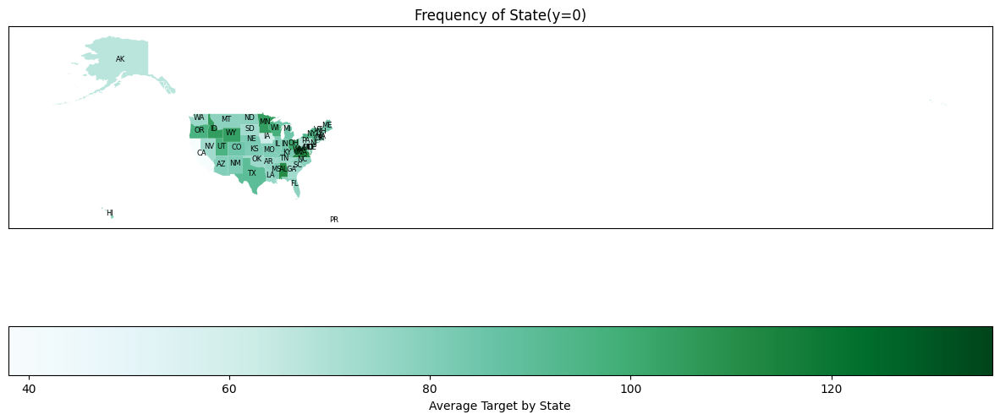

   state  target
0     WV     136
1     VA     112
2     AL     111
3     MN     105
4     ID     105
5     WY     104
6     OH     101
7     WI      98
8     UT      96
9     OR      96
10    NY      94
11    RI      92
12    VT      91
13    TX      90
14    MA      86
15    CO      85
16    MI      85
17    ME      84
18    KY      84
19    NJ      84
20    IN      84
21    NH      83
22    CT      83
23    MS      82
24    NE      82
28    HI      81
30    KS      81
29    MO      81
25    NM      81
27    MD      81
26    IL      81
31    AZ      80
32    DE      79
33    DC      79
34    NC      79
35    ND      78
36    FL      78
37    MT      78
38    AR      76
41    TN      75
40    LA      75
39    SC      75
42    WA      74
43    OK      74
44    SD      73
45    NV      73
46    GA      73
47    PA      69
48    AK      67
49    IA      61
50    CA      38


In [34]:
# 2) target=0(이탈하지 않은 고객) 데이터
state_counts = df[df["target"] == 0]["state"].value_counts().reset_index()
state_counts.columns = ["state", "target"]

plot_us_state_data(state_counts, "target", "Frequency of State(y=0)", "BuGn")

# sort
state_counts = state_counts.sort_values(by="target", ascending=False)
print(state_counts)

#### **(5) 국제 통화 이용 여부별 이탈 고객 수**

In [35]:
# 국제 통화 이용 여부별 이탈 고객
intl_result = pd.crosstab(df["target"], df["international_plan"])
intl_result

international_plan,no,yes
target,,
0,4019,274
1,508,199


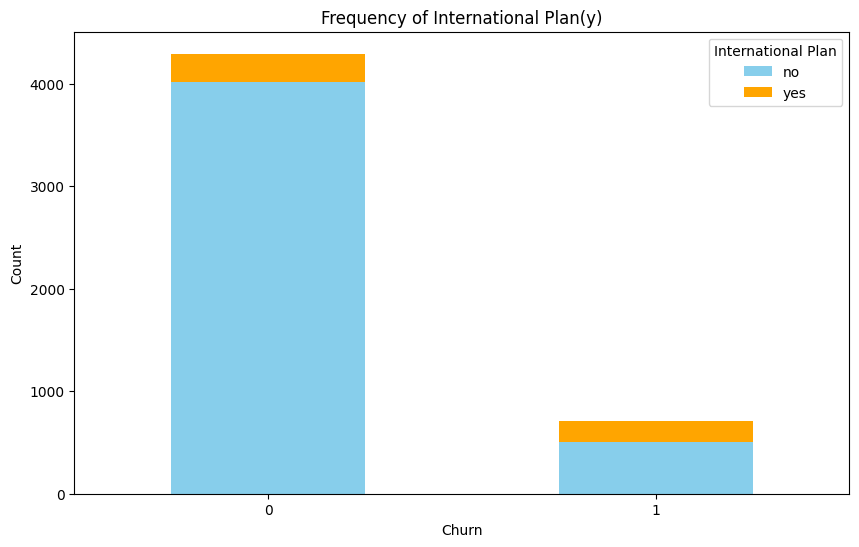

In [36]:
# Visualization
intl_result.plot(kind='bar', stacked=True, color=['skyblue', 'orange'], figsize=(10, 6))

plt.title('Frequency of International Plan(y)')
plt.xlabel('Churn')
plt.ylabel('Count')
plt.legend(title='International Plan')
plt.xticks(rotation=0)

plt.show()

#### **(6) 음성 메일 이용 여부별 이탈 고객 수**

In [37]:
# 음성 메일 서비스 이용 여부별 이탈 고객
voice_result = pd.crosstab(df["target"], df["voice_mail_plan"])
voice_result

voice_mail_plan,no,yes
target,,
0,3072,1221
1,605,102


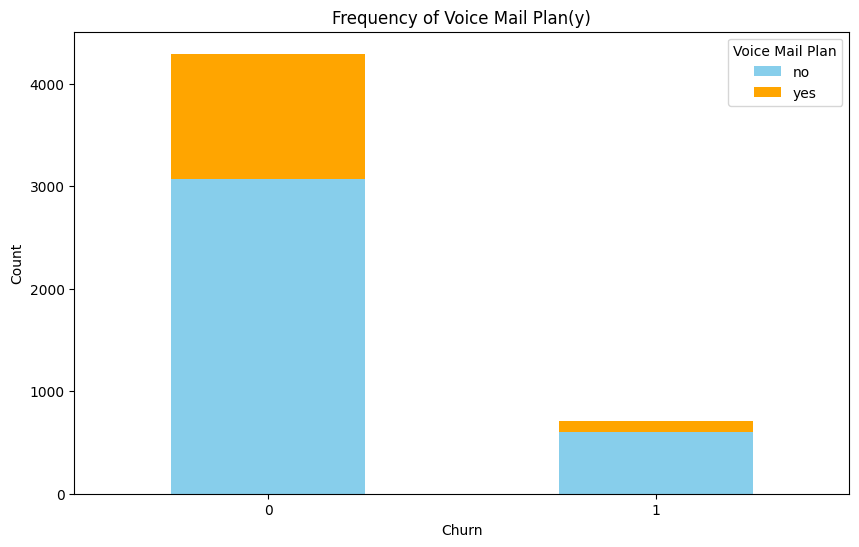

In [38]:
# Visualization
voice_result.plot(kind='bar', stacked=True, color=['skyblue', 'orange'], figsize=(10, 6))

plt.title('Frequency of Voice Mail Plan(y)')
plt.xlabel('Churn')
plt.ylabel('Count')
plt.legend(title='Voice Mail Plan')
plt.xticks(rotation=0)

plt.show()

#### **(7) 고객 서비스 전화 횟수별 이탈 고객 수**

In [39]:
# 고객 서비스 전화 횟수별 이탈 고객
service_result = pd.crosstab(df["number_customer_service_calls"], df["target"])
service_result

target,0,1
number_customer_service_calls,,
0,902,121
1,1596,190
2,1005,122
3,592,73
4,141,111
5,38,58
6,12,22
7,6,7
8,1,1


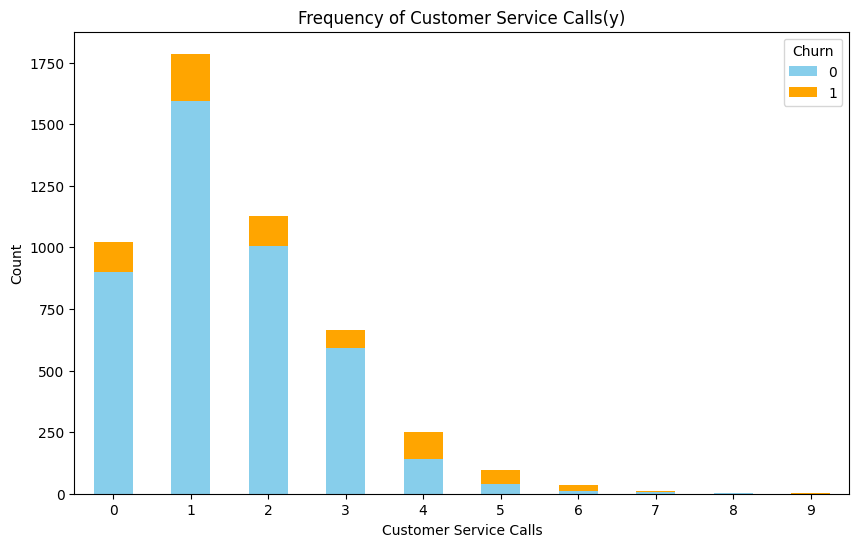

In [40]:
# Visualization
service_result.plot(kind='bar', stacked=True, color=['skyblue', 'orange'], figsize=(10, 6))

plt.title('Frequency of Customer Service Calls(y)')
plt.xlabel('Customer Service Calls')
plt.ylabel('Count')
plt.legend(title='Churn')
plt.xticks(rotation=0)

plt.show()

### **2) Relative frequency histogram**

In [41]:
# 설명변수 타입별 분리
continuous_columns = df_encoded.select_dtypes(include=['number']).columns.tolist()
categorical_columns = df_encoded.select_dtypes(include=['object']).columns.tolist()
boolean_columns = ['international_plan', 'voice_mail_plan']

# 결과 딕셔너리 선언
result = {}

# 연속형 변수 처리
for column in continuous_columns:
    if column == target_name:  # target 컬럼은 제외
        continue
    df_encoded[f'{column}'] = pd.cut(df_encoded[column], bins=10, labels=False)
    bin_counts = df_encoded.groupby(f'{column}')[target_name].value_counts().unstack(fill_value=0)
    result[column] = bin_counts

# 범주형 변수 처리
for column in categorical_columns:
    bin_counts = df_encoded.groupby(column)[target_name].value_counts().unstack(fill_value=0)
    result[column] = bin_counts

# boolean 변수 처리
for column in boolean_columns:
    bin_counts = df_encoded.groupby(column)[target_name].value_counts().unstack(fill_value=0)
    result[column] = bin_counts

# 결과 출력
for column, data in result.items():
    print(f"=== {column} ===")
    print(data)
    print()

=== account_length ===
target             0    1
account_length           
0                131   21
1                315   43
2                655  100
3                966  152
4               1011  187
5                695  109
6                345   61
7                137   25
8                 29    6
9                  9    3

=== number_vmail_messages ===
target                    0    1
number_vmail_messages           
0                      3074  605
1                        10    0
2                        38    1
3                       107    8
4                       297   16
5                       311   28
6                       222   28
7                       165   11
8                        55    8
9                        14    2

=== total_day_minutes ===
target                0    1
total_day_minutes           
0                    17    1
1                    81   11
2                   269   33
3                   635   97
4                  1068  120
5       

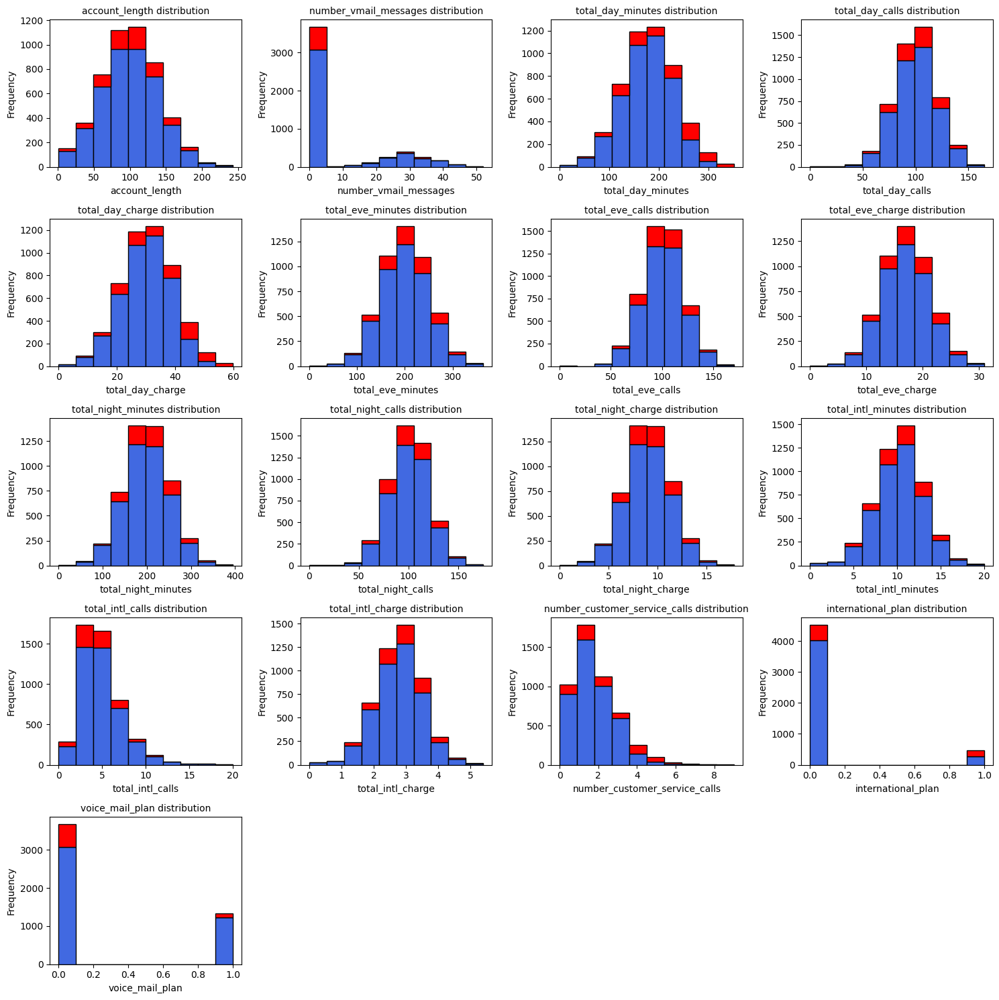

In [42]:
# 각 target 값에 대한 데이터프레임 생성
target0_df = numeric_df[numeric_df[target_name] == 0]
target1_df = numeric_df[numeric_df[target_name] == 1]

# 설명변수 선택(target 컬럼 제외)
variables = [col for col in numeric_df.columns if col != target_name]

# Visualization
plt.figure(figsize=(15, 15))

for i, variables in enumerate(variables):
    plt.subplot(5, 4, i + 1)
    plt.hist([target0_df[variables], target1_df[variables]], bins=10, stacked=True, color=['royalblue', 'red'], edgecolor='black')
    plt.title(f'{variables} distribution',fontsize=10)
    plt.xlabel(variables)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

### **3) Correlation heatmap**

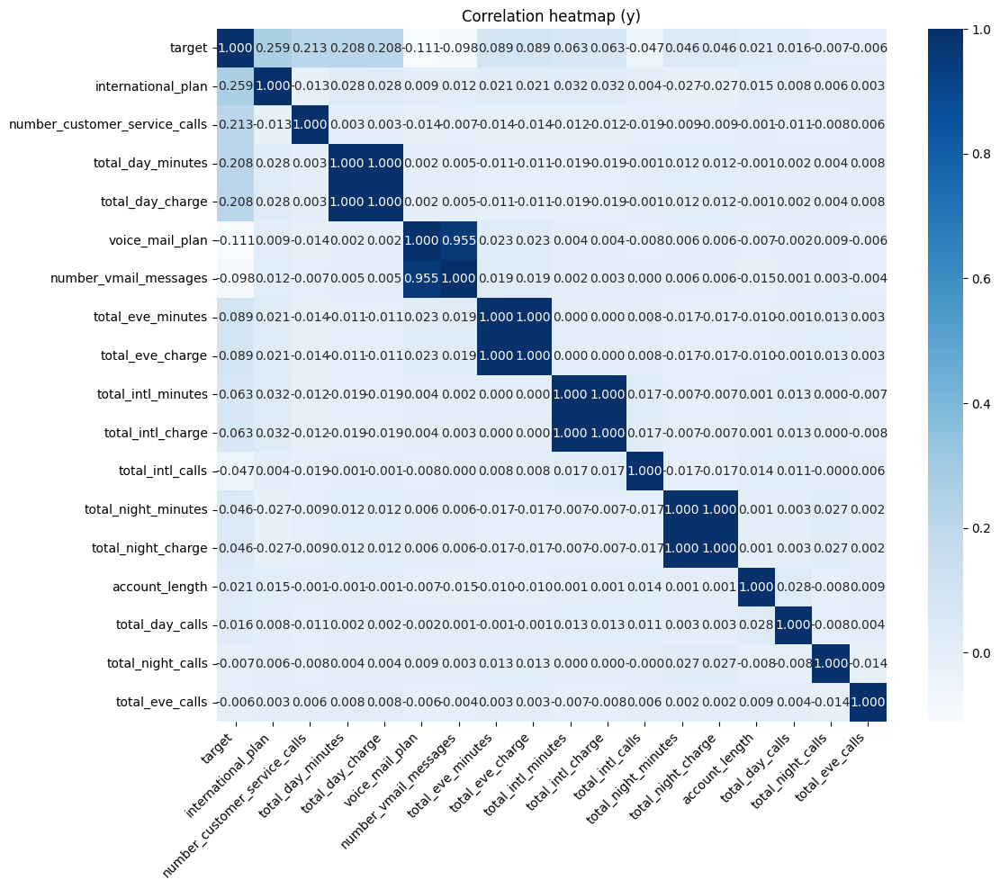

In [43]:
# 전체 데이터
# 상관관계 계산
correlation_matrix = numeric_df.corr()

# 타켓 선택
target_correlation = abs(correlation_matrix[target_name])

# 상관관계 높은순 정렬
sorted_correlation = target_correlation.sort_values(ascending=False)
sorted_correlation_matrix = correlation_matrix.loc[sorted_correlation.index, sorted_correlation.index]

# Visualization
plt.figure(figsize = (12,10))
g = sns.heatmap(sorted_correlation_matrix, annot = True, cmap='Blues', fmt = '.3f')
g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')
g.set_title('Correlation heatmap (y)')
plt.show()

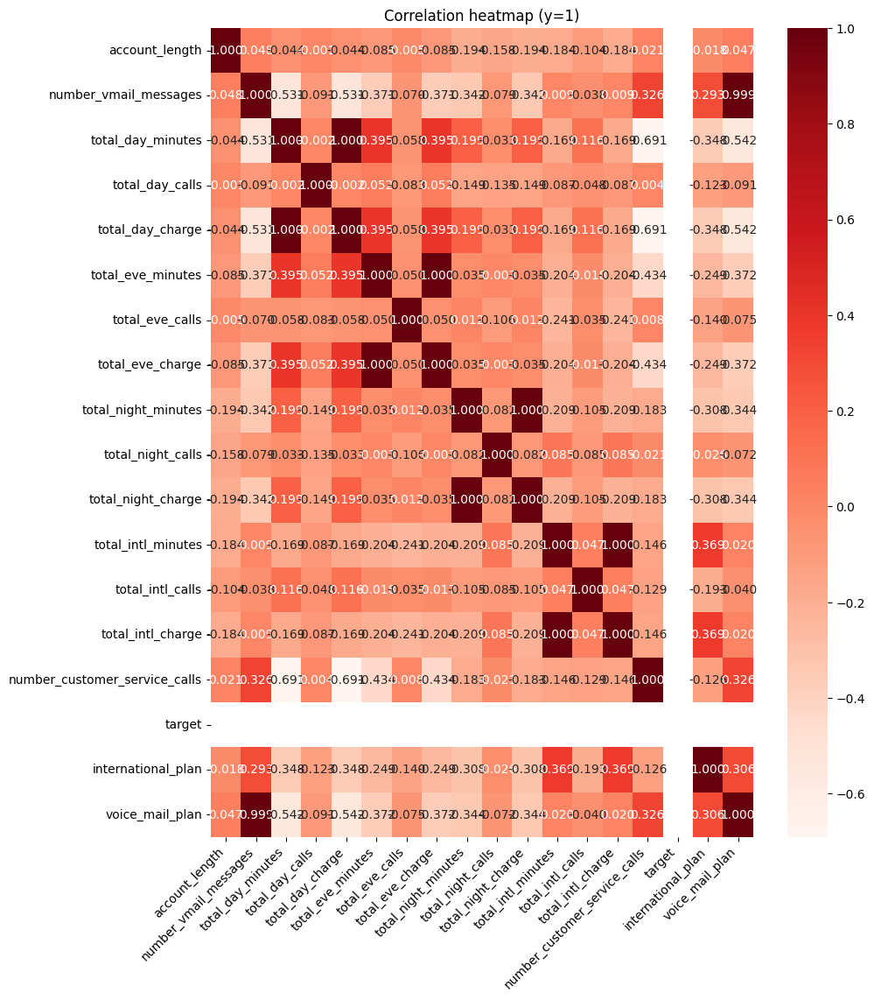

In [44]:
# target=1(이탈 고객) 데이터
# 상관관계 계산
target1_correlation_matrix = target1_df.corr()

# 타켓 선택
target1_correlation = abs(target1_correlation_matrix[target_name])

# 상관관계 높은순 정렬
target1_sorted_correlation = target1_correlation.sort_values(ascending=False)
target1_sorted_correlation_matrix = target1_correlation_matrix.loc[target1_sorted_correlation.index, target1_sorted_correlation.index]

# Visualization
plt.figure(figsize = (10, 12))
g = sns.heatmap(target1_sorted_correlation_matrix.corr(), annot = True, cmap='Reds', fmt = '.3f')
g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')
g.set_title('Correlation heatmap (y=1)')
plt.show()

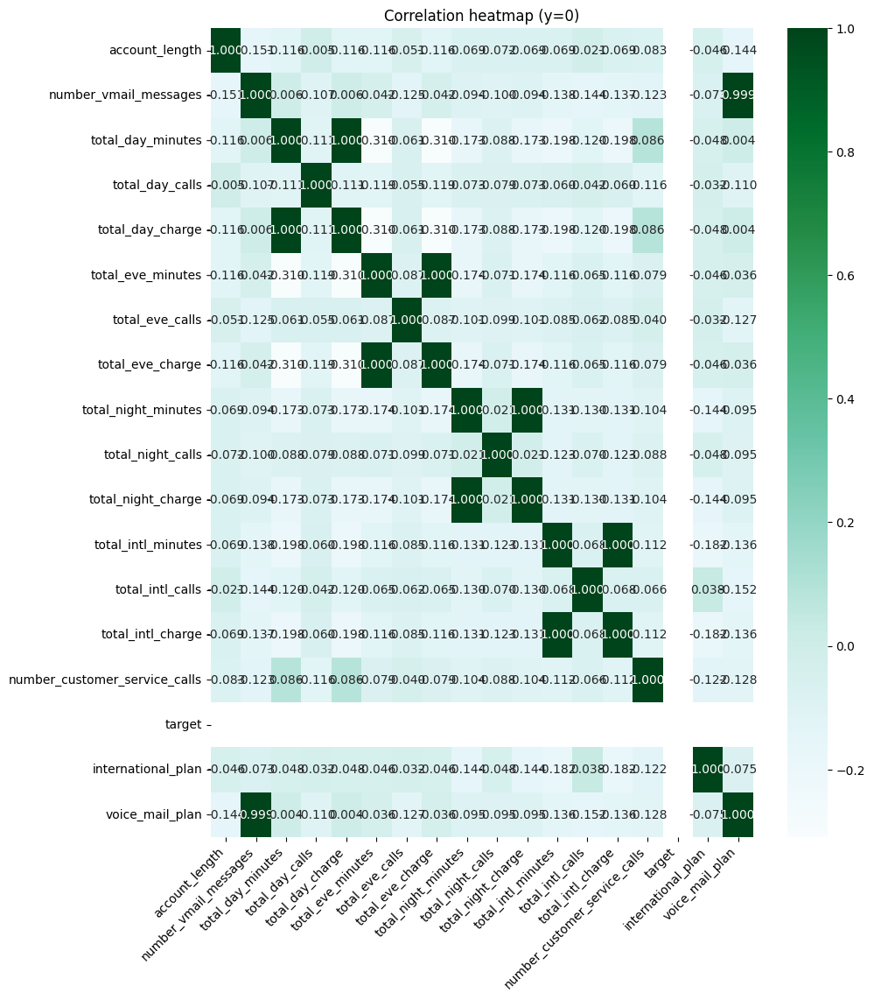

In [45]:
# target=0(이탈하지 않은 고객) 데이터
# 상관관계 계산
target0_correlation_matrix = target0_df.corr()

# 타켓 선택
target0_correlation = abs(target0_correlation_matrix[target_name])

# 상관관계 높은순 정렬
target0_sorted_correlation = target0_correlation.sort_values(ascending=False)
target0_sorted_correlation_matrix = target0_correlation_matrix.loc[target0_sorted_correlation.index, target0_sorted_correlation.index]

# Visualization
plt.figure(figsize = (10, 12))
g = sns.heatmap(target0_sorted_correlation_matrix.corr(), annot = True, cmap='BuGn', fmt = '.3f')
g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')
g.set_title('Correlation heatmap (y=0)')
plt.show()

### **4) Scatter plot**

In [46]:
numeric_df.head()

,account_length,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,target,international_plan,voice_mail_plan
0,128,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0,0,1
1,107,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0,0,1
2,137,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0,0,0
3,84,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0,1,0
4,75,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0,1,0


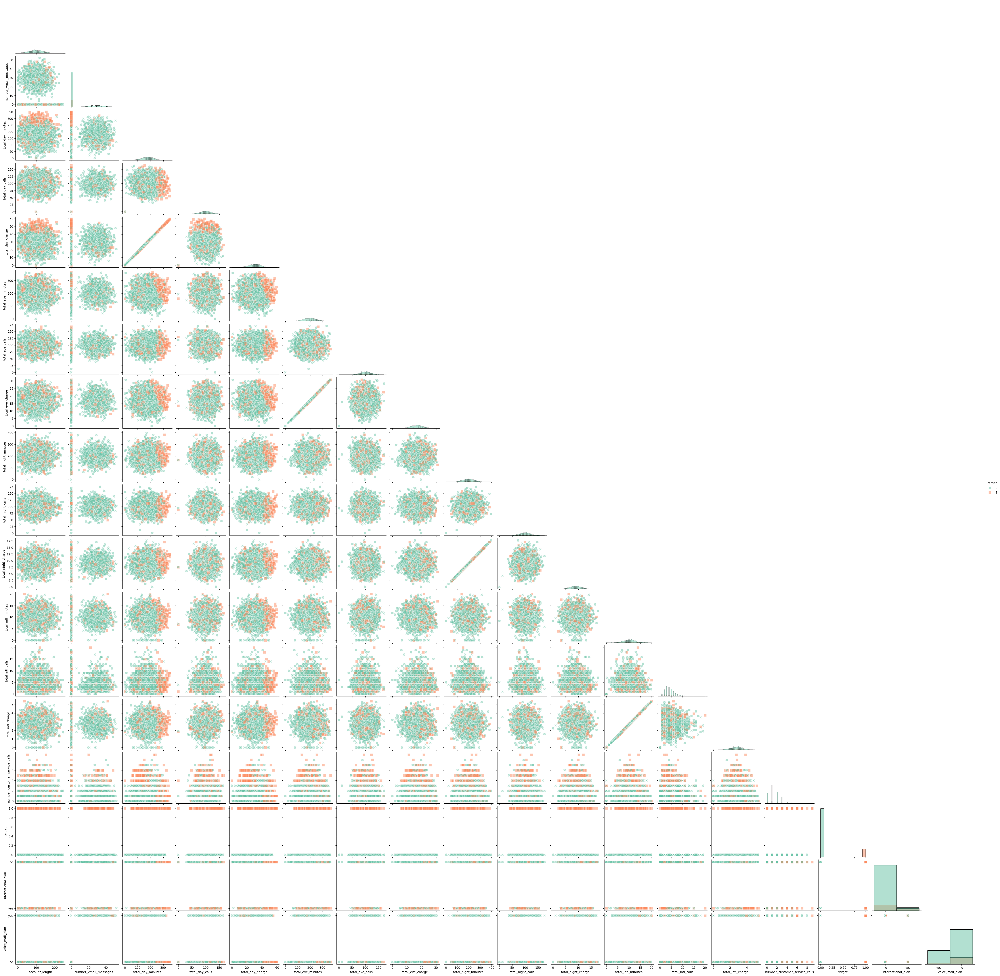

In [47]:
predictors = numeric_df
sns.pairplot(df,vars=predictors, hue = target_name, hue_order=[0,1],
             diag_kind='hist',
             kind = 'scatter', markers=["X", "s"], plot_kws={"s": 70, "alpha" : 0.5},
             palette="Set2",corner=True)
plt.show()

### **5) Coverage-Homogeneity plot**

In [48]:
def _coverage(subset,n):
    return subset.shape[0]/n
def _homogeneity(y):
    _, counts = np.unique(y, return_counts=True)
    ps = counts / len(y)
    return ps
def coverHomo(dataset, target_name, col, operator):
    coverage = []
    homogeneity = []
    unique_values = np.unique(dataset[col])
    ops = {"<=": (lambda x,y: x<=y), ">=": (lambda x,y: x>=y)}
    for cut_point in unique_values:
        subset = dataset[ops[operator] (dataset[col],cut_point)]
        coverage.append(_coverage(subset[target_name], dataset.shape[0]))
        homogeneity.append(_homogeneity(subset[target_name]))
    return coverage, homogeneity, unique_values

In [49]:
num_col = df_encoded.drop(columns=target_name).select_dtypes(include=['number']).columns.tolist()
print('numeric:',num_col)
cat_col = df_encoded.drop(columns=target_name).select_dtypes(include=['object']).columns.tolist()
print('categorical:',cat_col)

numeric: ['account_length', 'number_vmail_messages', 'total_day_minutes', 'total_day_calls', 'total_day_charge', 'total_eve_minutes', 'total_eve_calls', 'total_eve_charge', 'total_night_minutes', 'total_night_calls', 'total_night_charge', 'total_intl_minutes', 'total_intl_calls', 'total_intl_charge', 'number_customer_service_calls', 'international_plan', 'voice_mail_plan']
categorical: ['state', 'area_code']


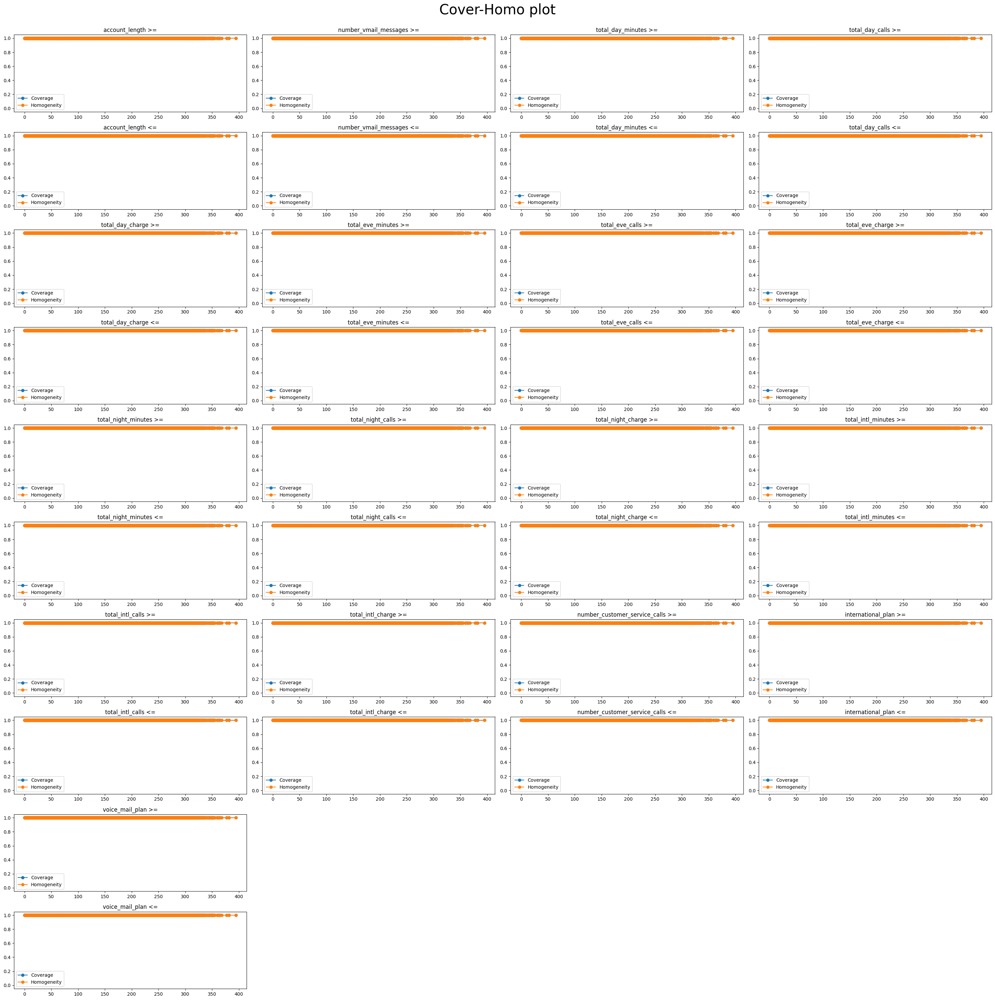

In [50]:
ncols = 4
nrows = len(num_col) // ncols + (len(num_col) % ncols > 0)
n=1
i=0

plt.figure(figsize=(30, 30))
for col in num_col[:]:
    ax1 = plt.subplot(nrows*2, ncols, n+i)
    cover, homo, cut_points = coverHomo(numeric_df, target_name, num_col, '>=')
    ax1.plot(cut_points,cover,'-o')
    ax1.plot(cut_points,homo,'-o')
    ax1.set_title(col +' >=')
    ax1.legend(['Coverage','Homogeneity'])
    ax1.set_ylim(-0.05,1.05)

    ax2 = plt.subplot(nrows*2, ncols, n+i+ncols)
    cover, homo, cut_points = coverHomo(numeric_df, target_name, num_col, '<=')
    ax2.plot(cut_points,cover,'-o')
    ax2.plot(cut_points,homo,'-o')
    ax2.set_title(col +' <=')
    ax2.legend(['Coverage','Homogeneity'])
    ax2.set_ylim(-0.05,1.05)
    if n % (ncols) == 0 : i+=ncols
    n+=1

plt.suptitle("Cover-Homo plot", fontsize=30, y=1)
plt.savefig('coverHomo.png', dpi=300, transparent=True) # save figure (dpi=300, transparent=True)
plt.tight_layout()
plt.show()

## **4. Classfication model**

### **1) Decision Tree**

In [51]:
from sklearn.tree import DecisionTreeClassifier, export_graphviz
import graphviz

In [52]:
# X와 y 변수 선택
X = df_encoded[feature_names]
y = df_encoded[target_name]

# 결과 출력
X

,account_length,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls
0,5,0,9,4,7,6,7,5,5,5,6,5,6,4,1,4,1
1,4,0,9,4,4,7,4,5,6,5,6,5,6,6,1,6,1
2,5,0,0,0,6,6,6,3,6,3,4,5,4,6,2,6,0
3,3,9,0,0,8,4,8,1,5,1,4,5,4,3,3,3,2
4,3,9,0,0,4,6,4,4,7,4,4,6,4,5,1,5,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2,0,9,7,6,7,6,6,7,6,7,6,7,4,2,4,2
4996,6,0,0,0,5,5,5,7,4,7,5,6,5,7,0,7,3
4997,2,0,0,0,3,5,3,4,7,4,5,5,5,6,1,6,1
4998,4,0,0,0,5,4,5,4,5,4,5,5,5,4,2,4,0


In [53]:
# Splitting the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=12)

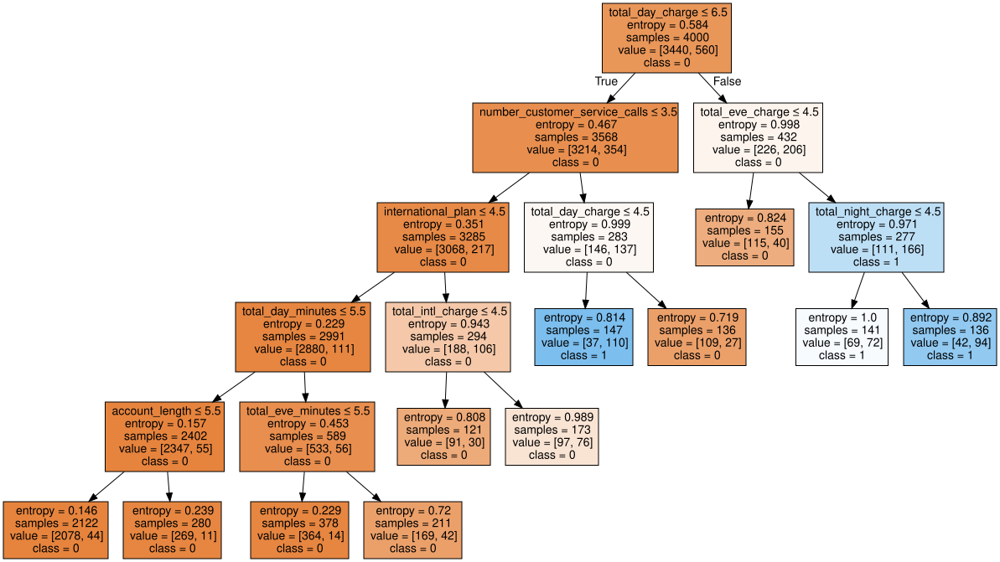

In [54]:
# Decision tree fitting
dt = DecisionTreeClassifier(criterion='entropy', min_samples_leaf=0.03, max_depth=5, random_state=12)
dt.fit(X_train, y_train)

# Visualization
dot_data = export_graphviz(dt, out_file=None,
                      feature_names=feature_names,
                      class_names=["0", "1"],
                      filled=True, rounded=False,
                      proportion=False,
                      special_characters=True)
visulize_dt = graphviz.Source(dot_data)
visulize_dt

### **2) Logistic regression**

In [55]:
pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.5/540.5 kB 8.0 MB/s eta 0:00:00


In [56]:
from sklearn.linear_model import LogisticRegression
import shap
import statsmodels.api as sm

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


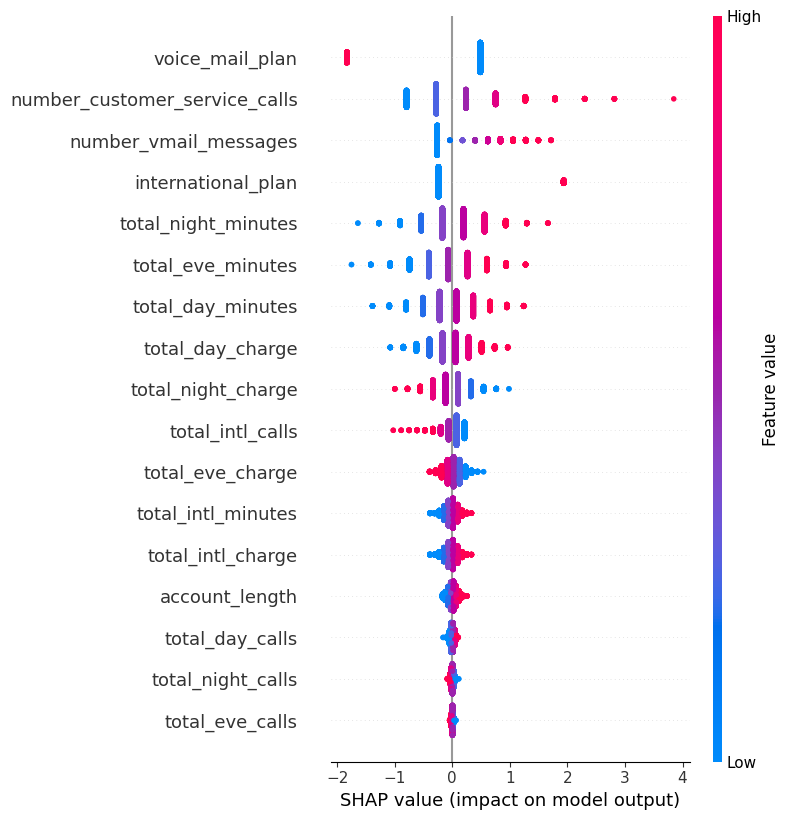

In [57]:
# Logistic Regression fitting
lr = LogisticRegression(random_state=12)
lr.fit(X_train, y_train)
lr_predictions = lr.predict(X_test)

lr_explainer = shap.Explainer(lr, X_train)
shap_values = lr_explainer(X_train)

# Visualization
shap.summary_plot(shap_values, X_train, feature_names=feature_names)

In [58]:
# statsmodels를 사용한 로지스틱 회귀 모델 학습
X_train_sm = sm.add_constant(X_train)
logit_model = sm.Logit(y_train, X_train_sm)
result = logit_model.fit()

# 회귀 계수 및 p-value 계산
coefficients = result.params
p_values = result.pvalues
pd.options.display.float_format = '{:.20f}'.format
const_feature_names = ['const'] + feature_names

# 결과 출력
coef_df = pd.DataFrame({'Feature': const_feature_names, 'Coefficient': coefficients, 'P-value': p_values})
coef_df

         Current function value: 0.309878
         Iterations: 35


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


,Feature,Coefficient,P-value
const,const,-8.02533657978443493164,0.00000000000000000000
account_length,account_length,0.04654356973994577817,0.13158532699993444326
international_plan,international_plan,0.24186101586423514043,0.00000000000000000000
voice_mail_plan,voice_mail_plan,-0.25783939627778706960,0.00000411220487017477
number_vmail_messages,number_vmail_messages,0.22003955203209210612,0.01310781042350371919
total_day_minutes,total_day_minutes,0.42129275513526442953,0.76758446017728809707
total_day_calls,total_day_calls,0.02813660032508356890,0.50780767328025488982
total_day_charge,total_day_charge,0.09638388496362597369,0.94611583725783710008
total_eve_minutes,total_eve_minutes,17.88929846654903599301,0.99841480015623507160
total_eve_calls,total_eve_calls,-0.01251358314558595128,0.77193920722920672528


### **3) Random forest**

In [59]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import export_graphviz
import graphviz
import pydotplus
from IPython.display import Image

In [60]:
pip install pydotplus

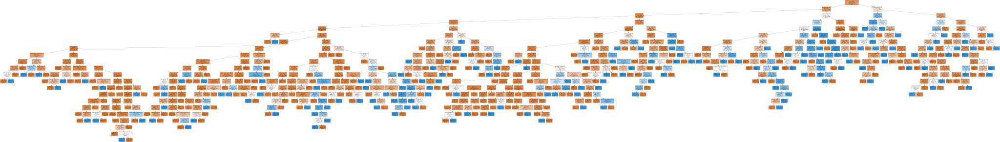

In [61]:
# Random Forest fitting
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Visualization
estimator = rf.estimators_[0]  # Visualizing one of the trees
dot_data_rf = export_graphviz(estimator, out_file=None,
                              feature_names=feature_names,
                              class_names=target_name,
                              filled=True, rounded=False,
                              proportion=True,
                              special_characters=True)
visulize_rf = graphviz.Source(dot_data_rf)
visulize_rf

In [62]:
# 각 특징의 중요도 추출
feature_importance = np.mean([tree.feature_importances_ for tree in rf.estimators_], axis=0)

# 중요도를 DataFrame으로 변환하여 출력
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importance})
importance_df

,Feature,Importance
0,account_length,0.04515168364441923821
1,international_plan,0.08858519551220243871
2,voice_mail_plan,0.02232984081777203769
3,number_vmail_messages,0.03522851702152219461
4,total_day_minutes,0.11822131910945760103
5,total_day_calls,0.03597157659013835995
6,total_day_charge,0.12148967041976006798
7,total_eve_minutes,0.05118018242708619742
8,total_eve_calls,0.03569062172227990132
9,total_eve_charge,0.05189993529690681978


In [63]:
# Save the graph as a PNG file
visulize_rf_png = pydotplus.graph_from_dot_data(dot_data_rf)
visulize_rf_png.write_png("random_forest_tree.png")

True

### **4) Gradient boosting**

In [64]:
from sklearn.ensemble import GradientBoostingClassifier

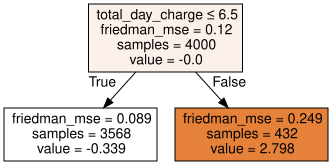

In [65]:
# Gradient Boosting fitting
gb = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1, random_state=42)
gb.fit(X_train, y_train)

# Visualization
estimator = gb.estimators_[0][0]  # Visualizing one of the trees
dot_data_gb = export_graphviz(estimator, out_file=None,
                              feature_names=feature_names,
                              class_names=target_name,
                              filled=True, rounded=False,
                              proportion=False,
                              special_characters=True)
visulize_gb = graphviz.Source(dot_data_gb)
visulize_gb

### **5) Naive-bayse**

In [105]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [86]:
# Naive-bayse fitting
nb = GaussianNB()
nb.fit(X_train, y_train)

GaussianNB()

### **6) k-NN**

In [102]:
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.neighbors import KNeighborsClassifier

In [100]:
# data scaling
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [110]:
# find optimal k
k_range = range(1, 31)
k_scores = []

for k in k_range:
    knn = KNeighborsClassifier(n_neighbors=k)
    scores = cross_val_score(knn, X_train, y_train, cv=10, scoring='accuracy')
    k_scores.append(scores.mean())

optimal_k = k_range[np.argmax(k_scores)]
print(f'Optimal k: {optimal_k}')

Optimal k: 5


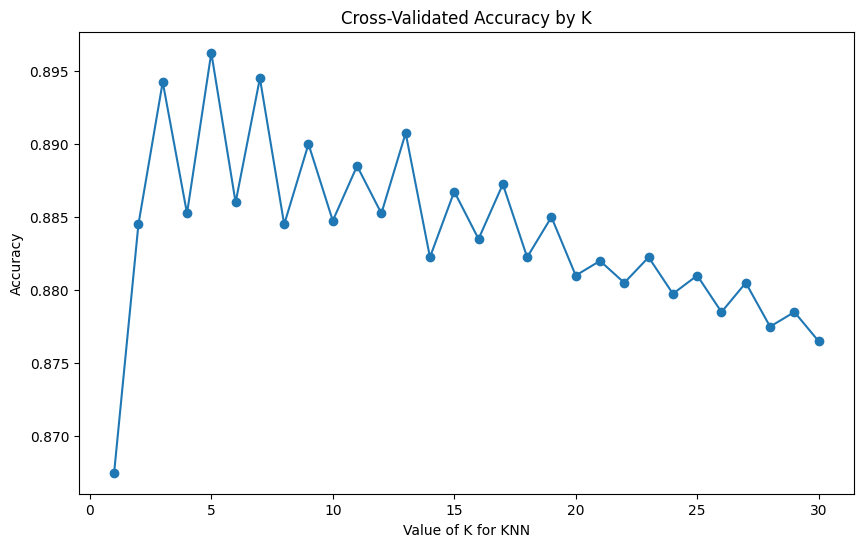

In [111]:
# k값별 정확도 시각화
plt.figure(figsize=(10, 6))
plt.plot(k_range, k_scores, marker='o')
plt.xlabel('Value of K for KNN')
plt.ylabel('Accuracy')
plt.title('Cross-Validated Accuracy by K')
plt.show()

In [114]:
# k-NN fitting
knn = KNeighborsClassifier(n_neighbors=optimal_k)
knn.fit(X_train, y_train)

KNeighborsClassifier()

### **7) Predictive performance**

In [116]:
# 테스트셋 예측
# 1) Decision Tree 모델
dt_predictions = dt.predict(X_test)

# 2) Logistic Regression 모델
lr_predictions = lr.predict(X_test)

# 3) Random Forest 모델
rf_predictions = rf.predict(X_test)

# 4) Gradient Boosting 모델
gb_predictions = gb.predict(X_test)

# 5) Naive-bayse 모델
nb_predictions = nb.predict(X_test)

# 6) k-NN 모델
knn_predictions = knn.predict(X_test)
knn_predictions_prob = knn.predict_proba(X_test)[:, 1]

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  warnings.warn(


In [88]:
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score

In [117]:
# 성능 비교
def rounded_value(value):
    return round(value, 3)

# 1) Decision Tree 모델
dt_accuracy = rounded_value(accuracy_score(y_test, dt_predictions))
dt_f1 = rounded_value(f1_score(y_test, dt_predictions))
dt_auroc = rounded_value(roc_auc_score(y_test, dt_predictions))

# 2) Logistic Regression 모델
lr_accuracy = rounded_value(accuracy_score(y_test, lr_predictions))
lr_f1 = rounded_value(f1_score(y_test, lr_predictions))
lr_auroc = rounded_value(roc_auc_score(y_test, lr_predictions))

# 3) Random Forest 모델
rf_accuracy = rounded_value(accuracy_score(y_test, rf_predictions))
rf_f1 = rounded_value(f1_score(y_test, rf_predictions))
rf_auroc = rounded_value(roc_auc_score(y_test, rf_predictions))

# 4) Gradient Boosting 모델
gb_accuracy = rounded_value(accuracy_score(y_test, gb_predictions))
gb_f1 = rounded_value(f1_score(y_test, gb_predictions))
gb_auroc = rounded_value(roc_auc_score(y_test, gb_predictions))

# 5) Naive-bayse 모델
nb_accuracy = rounded_value(accuracy_score(y_test, nb_predictions))
nb_f1 = rounded_value(f1_score(y_test, nb_predictions))
nb_auroc = rounded_value(roc_auc_score(y_test, nb_predictions))

# 6) k-NN 모델
knn_accuracy = rounded_value(accuracy_score(y_test, knn_predictions))
knn_f1 = rounded_value(f1_score(y_test, knn_predictions))
knn_auroc = rounded_value(roc_auc_score(y_test, knn_predictions))


# 결과 출력
result = {
    "Model": ["Decision Tree", "Logistic Regression", "Random Forest", "Gradient Boosting", "Naive-bayse", "k-NN"],
    "Accuracy": [
        dt_accuracy,
        lr_accuracy,
        rf_accuracy,
        gb_accuracy,
        nb_accuracy,
        knn_accuracy
    ],
    "F1-score": [
        dt_f1,
        lr_f1,
        rf_f1,
        gb_f1,
        nb_f1,
        knn_f1
    ],
    "AUROC": [
        dt_auroc,
        lr_auroc,
        rf_auroc,
        gb_auroc,
        nb_auroc,
        knn_auroc
    ]
}

result_df = pd.DataFrame(result)
result_df

,Model,Accuracy,F1-score,AUROC
0,Decision Tree,0.85499999999999998224,0.04000000000000000083,0.51000000000000000888
1,Logistic Regression,0.85299999999999998046,0.00000000000000000000,0.50000000000000000000
2,Random Forest,0.85499999999999998224,0.04000000000000000083,0.51000000000000000888
3,Gradient Boosting,0.85299999999999998046,0.00000000000000000000,0.50000000000000000000
4,Naive-bayse,0.80000000000000004441,0.21299999999999999489,0.54500000000000003997
5,k-NN,0.91900000000000003908,0.64600000000000001865,0.74699999999999999734


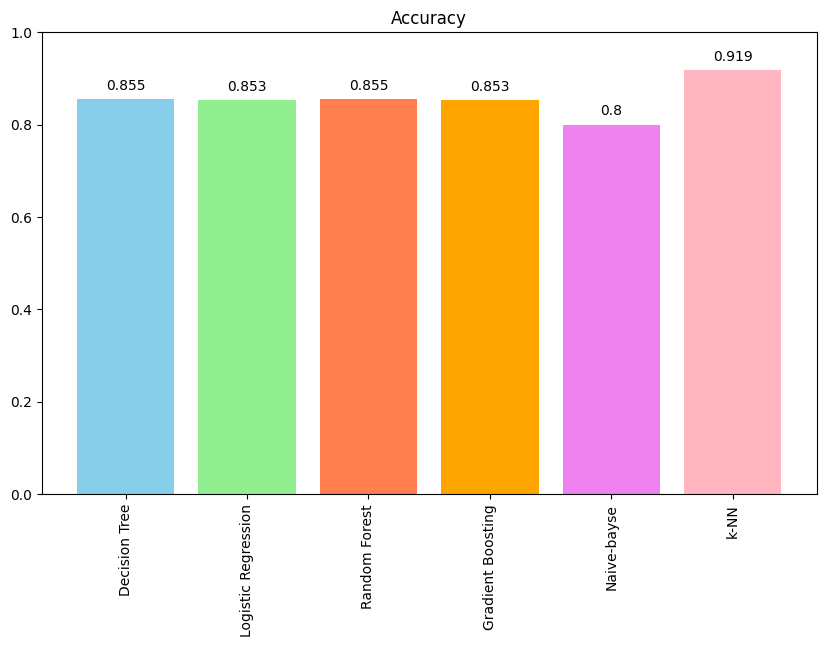

In [126]:
# Visualization
# 1) Accuracy(정확도)
colors = ['skyblue', 'lightgreen', 'coral', 'orange', 'violet', 'lightpink']

plt.figure(figsize=(10, 6))
plt.bar(result_df['Model'], result_df['Accuracy'], color=colors)
plt.xticks(rotation=90)
plt.title('Accuracy')
plt.ylim(0, 1)

for i in range(len(result_df['Accuracy'])):
    plt.text(i, result_df['Accuracy'][i] + 0.02, result_df['Accuracy'][i], ha='center')

plt.show()

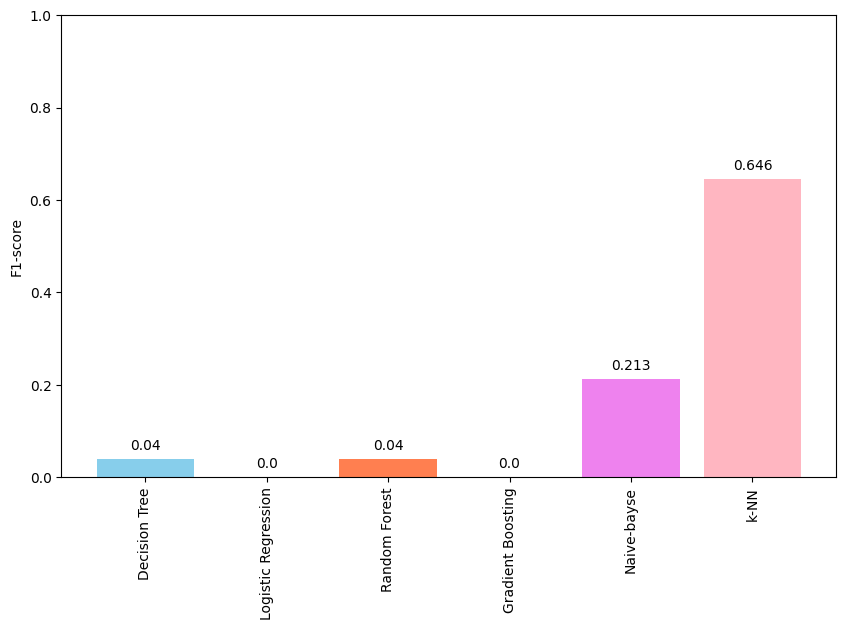

In [127]:
# Visualization
# 2) F1-score
plt.figure(figsize=(10, 6))
bars = plt.bar(result_df['Model'], result_df['F1-score'], color=colors)
plt.xticks(rotation=90)
plt.ylabel('F1-score')
plt.ylim(0, 1)

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2.0, height + 0.02, round(height, 3), ha='center')

plt.show()

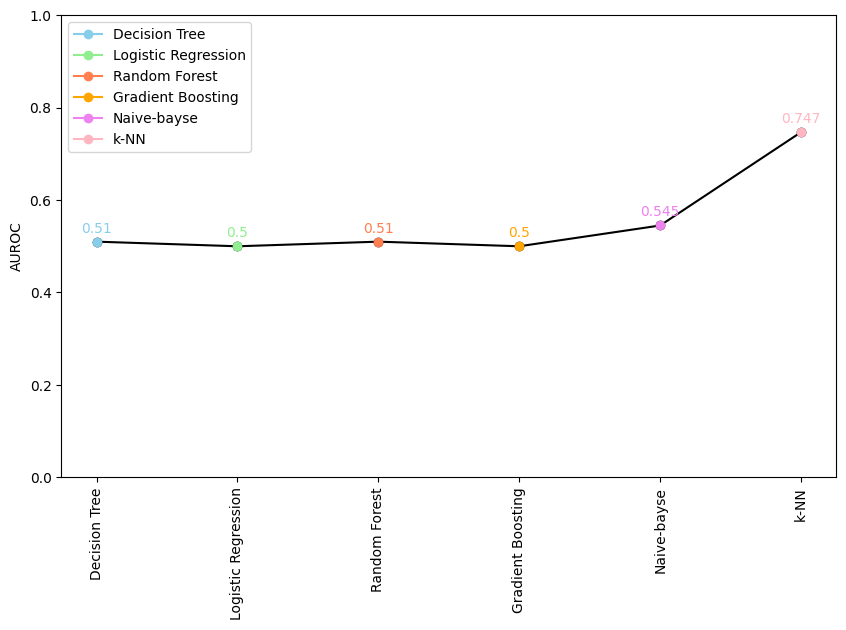

In [128]:
# Visualization
# 3) AUROC
plt.figure(figsize=(10, 6))
plt.plot(result_df['Model'], result_df['AUROC'], marker='o', linestyle='-', color='black')
for i, color in enumerate(colors):
    plt.plot(result_df['Model'][i], result_df['AUROC'][i], marker='o', color=color, label=result_df['Model'][i])
plt.xticks(rotation=90)
plt.ylabel('AUROC')
plt.ylim(0, 1)

for i, value in enumerate(result_df['AUROC']):
    plt.text(i, value + 0.02, round(value, 3), ha='center', color=colors[i])

plt.legend()

## **5. Color DT**

In [75]:
from IPython.display import display, HTML
from IPython.display import Image
from matplotlib.colors import LinearSegmentedColormap
import graphviz

In [76]:
class colorDT:
   def __init__(self, model, feature_names, class_names):
       self.clf = model
       self.feature_names = feature_names
       self.class_names = class_names
       self.df_rule_rf = pd.DataFrame(columns=['Rule Type', 'RF Difference', 'Index'])

   def _colorDT(self, pruned=False):
       def _color_brew(n_classes):
           if n_classes == 1:
               colors = [(255, 255, 255)]
           else:
               color_map = LinearSegmentedColormap.from_list(
                   "tree_colors",
                   [(1.0, 0.6, 0.2), (0.2, 0.6, 1.0)],
                   N=n_classes)
               colors = [color_map(i / (n_classes - 1)) for i in range(n_classes)]
               colors = [(int(r * 255), int(g * 255), int(b * 255)) for r, g, b, _ in colors]
           return colors

       def make_col(tree, node):
           values = tree.value[node][0]
           if tree.n_classes[0] == 1:
               color = (255, 255, 255)
               alpha = (values.item() - tree.value.min()) / (tree.value.max() - tree.value.min())
           else:
               color = _color_brew(tree.n_classes[0])[np.argmax(values)]
               sorted_values = sorted(values, reverse=True)
               if len(sorted_values) == 1:
                   alpha = 0.0
               else:
                   alpha = (sorted_values[0] - sorted_values[1]) / (sorted_values[0] + 1e-7)
           color = [int(round(alpha * c + (1 - alpha) * 255, 0)) for c in color]
           return "#%02x%02x%02x" % tuple(color)

       def make_col_edge(tree, node, child_index):
           parent_value = tree.value[node][0][0] / sum(tree.value[node][0])
           child_value = tree.value[child_index][0][0] / sum(tree.value[child_index][0])

           return "#FF6600" if child_value > parent_value else "#4169E1"

       tree = graphviz.Digraph(format='png')
       tree.attr(dpi='300')
       tree.attr(rankdir='TB')
       nodes = np.arange(self.clf.tree_.node_count)

       if pruned:
           self._prune_homogeneous_subtrees(nodes)

       for i in nodes:
           has_parent = any(i == self.clf.tree_.children_left[j] or i == self.clf.tree_.children_right[j] for j in nodes)
           if has_parent or self.clf.tree_.children_left[i] != -1 or self.clf.tree_.children_right[i] != -1:
            if self.clf.tree_.children_left[i] == -1 and self.clf.tree_.children_right[i] == -1:
                predicted_class = self.class_names[np.argmax(self.clf.tree_.value[i])]
                info = f'impurity={round(self.clf.tree_.impurity[i], 3)}\n RF=[{round(self.clf.tree_.value[i][0][0]/self.clf.tree_.n_node_samples[i],3)}, {round(self.clf.tree_.value[i][0][1]/self.clf.tree_.n_node_samples[i],3)}]'
                node_label = f'class={predicted_class}\n{info}'
                node_shape = 'box'
                node_width = '0.7'
                node_height = '0.4'
            else:
                condition = f'{self.feature_names[self.clf.tree_.feature[i]]} <= {round(self.clf.tree_.threshold[i], 3)}'
                info = f'impurity={round(self.clf.tree_.impurity[i], 3)}\n RF=[{round(self.clf.tree_.value[i][0][0]/self.clf.tree_.n_node_samples[i],3)}, {round(self.clf.tree_.value[i][0][1]/self.clf.tree_.n_node_samples[i],3)}]'
                node_label = f'{condition}\n{info}'
                node_shape = 'box'
                node_width = '0.75'
                node_height = '0.5'

            tree.node(str(i), label=node_label, fillcolor=make_col(self.clf.tree_, i),
                        shape=node_shape, style='filled', width=node_width,
                        height=node_height, color='black', fontname="helvetica")

            for child in [self.clf.tree_.children_left[i], self.clf.tree_.children_right[i]]:
                if child != -1:
                    edge_color = make_col_edge(self.clf.tree_, i, child)
                    tree.edge(str(i), str(child), color=edge_color, penwidth='1')
                    if self.clf.tree_.impurity[child] < self.clf.tree_.impurity[i]:
                        tree.edge(str(i), str(child), color=edge_color, penwidth='1')
                    else:
                        tree.edge(str(i), str(child), color=edge_color, penwidth='0', style='invis')

       return tree

   def _calculate_rule_rf(self, rule, X, y, class_name):
       rule_conditions = rule.split("IF ")[1].split(" THEN")[0].split(" and ")
       rule_matches = np.ones(len(X), dtype=bool)
       for condition in rule_conditions:
           feature, operator, value = condition.split(" ")
           if isinstance(self.feature_names, pd.Index):
               feature_idx = self.feature_names.tolist().index(feature)
           else:
               feature_idx = self.feature_names.index(feature)
           value = float(value)
           if operator == "<=":
               rule_matches &= (X[:, feature_idx] <= value)
           else:
               rule_matches &= (X[:, feature_idx] > value)

       class_idx = self.class_names.index(class_name)
       class_value = np.sort(np.unique(y))[class_idx]
       rule_class_count = np.sum(y[rule_matches] == class_value)
       rule_total_count = np.sum(rule_matches)
       rule_rf = rule_class_count / rule_total_count if rule_total_count > 0 else 0.0

       return rule_rf

   def classify_rules(self, X, y):
    n_nodes = self.clf.tree_.node_count
    children_left = self.clf.tree_.children_left
    children_right = self.clf.tree_.children_right
    feature = self.clf.tree_.feature
    threshold = self.clf.tree_.threshold
    values = self.clf.tree_.value
    if isinstance(X, pd.DataFrame):
       X = X.values
       y = y.values
    self.rules_str = ""

    def recurse(node, path, rule):
        if feature[node] != -2:
            name = self.feature_names[feature[node]]
            threshold_value = threshold[node]
            path.append((name, threshold_value, node))
            rule.append(f"{name} <= {threshold_value}")
            recurse(children_left[node], path, rule)
            rule.pop()
            rule.append(f"{name} > {threshold_value}")
            recurse(children_right[node], path, rule)
            rule.pop()
            path.pop()
        else:
            class_idx = values[node].argmax()
            class_name = self.class_names[class_idx]
            class_count = values[node].flatten()[class_idx]
            total_count = values[node].sum()
            rf = class_count / total_count

            irrelevant_conditions = []
            max_rf_node = None
            max_rf = -1
            rule_type = "Type 1"

            previous_rf = rf
            for name, threshold_value, parent_node in reversed(path):
                parent_class_count = values[parent_node].flatten()[class_idx]
                parent_total_count = values[parent_node].sum()
                parent_rf = parent_class_count / parent_total_count
                if parent_rf > max_rf:
                    max_rf = parent_rf
                    max_rf_node = parent_node
                if parent_rf > previous_rf:
                    irrelevant_conditions.append((name, threshold_value, parent_node))
                previous_rf = parent_rf
            if max_rf > rf:
                rule_type = "Type 2"

            original_rule_str = f"IF {' and '.join(rule)} THEN class = {class_name}"
            original_rule_rf = self._calculate_rule_rf(original_rule_str, X, y, class_name)

            if rule_type == "Type 1":
                self.rules_str += "Rule (Type 1)\n"
                self.rules_str += "Original Rule:\n"
                self.rules_str += f"{original_rule_str} (RF: {round(original_rule_rf,3)})\n"
                if irrelevant_conditions:
                    modified_rule = [r for r in rule if not any(r.startswith(condition[0]) and r.endswith(str(condition[1])) for condition in irrelevant_conditions)]
                    modified_rule_str = f"IF {' and '.join(modified_rule)} THEN class = {class_name}"
                    modified_rule_rf = self._calculate_rule_rf(modified_rule_str, X, y, class_name)
                    rf_difference = abs(original_rule_rf - modified_rule_rf)
                    self.df_rule_rf = pd.concat([self.df_rule_rf, pd.DataFrame({'Rule Type': 'Type 1-y', 'RF Difference': rf_difference, 'Index': len(self.df_rule_rf)}, index=[len(self.df_rule_rf)])], ignore_index=True)
                else:
                    modified_rule_str = original_rule_str
                    modified_rule_rf = original_rule_rf
                    rf_difference = abs(original_rule_rf - modified_rule_rf)
                    self.df_rule_rf = pd.concat([self.df_rule_rf, pd.DataFrame({'Rule Type': 'Type 1-n', 'RF Difference': rf_difference, 'Index': len(self.df_rule_rf)}, index=[len(self.df_rule_rf)])], ignore_index=True)
                self.rules_str += "Compact Rule:\n"
                self.rules_str += f"{modified_rule_str} (RF: {round(modified_rule_rf,3)})\n"
            else:
                self.rules_str += "Rule (Type 2)\n"
                self.rules_str += "Original Rule:\n"
                self.rules_str += f"{original_rule_str} (RF: {round(original_rule_rf,3)})\n"
                if irrelevant_conditions:
                    modified_rule_1 = [r for r in rule if not any(r.startswith(condition[0]) and r.endswith(str(condition[1])) for condition in irrelevant_conditions)]
                    modified_rule_str_1 = f"IF {' and '.join(modified_rule_1)} THEN class = {class_name}"
                    modified_rule_rf_1 = self._calculate_rule_rf(modified_rule_str_1, X, y, class_name)
                    rf_difference = abs(original_rule_rf - modified_rule_rf_1)
                    self.df_rule_rf = pd.concat([self.df_rule_rf, pd.DataFrame({'Rule Type': 'Type 2-m1', 'RF Difference': rf_difference, 'Index': len(self.df_rule_rf)}, index=[len(self.df_rule_rf)])], ignore_index=True)
                else:
                    modified_rule_str_1 = original_rule_str
                    modified_rule_rf_1 = original_rule_rf
                    rf_difference = abs(original_rule_rf - modified_rule_rf_1)
                    self.df_rule_rf = pd.concat([self.df_rule_rf, pd.DataFrame({'Rule Type': 'Type 2-m1-n', 'RF Difference': rf_difference, 'Index': len(self.df_rule_rf)}, index=[len(self.df_rule_rf)])], ignore_index=True)
                self.rules_str += "Compact Rule (Method 1 - Full path IR Removal):\n"
                self.rules_str += f"{modified_rule_str_1} (RF: {round(modified_rule_rf_1,3)})\n"

                irrelevant_conditions_2 = [condition for condition in irrelevant_conditions if condition[2] < max_rf_node]
                if irrelevant_conditions_2:
                    modified_rule_2 = [r for r in rule if not any(r.startswith(condition[0]) and r.endswith(str(condition[1])) for condition in irrelevant_conditions_2)]
                    modified_rule_str_2 = f"IF {' and '.join(modified_rule_2)} THEN class = {class_name}"
                    modified_rule_rf_2 = self._calculate_rule_rf(modified_rule_str_2, X, y, class_name)
                    rf_difference = abs(original_rule_rf - modified_rule_rf_2)
                    self.df_rule_rf = pd.concat([self.df_rule_rf, pd.DataFrame({'Rule Type': 'Type 2-m2-y', 'RF Difference': rf_difference, 'Index': len(self.df_rule_rf)}, index=[len(self.df_rule_rf)])], ignore_index=True)
                else:
                    modified_rule_str_2 = original_rule_str
                    modified_rule_rf_2 = original_rule_rf
                    rf_difference = abs(original_rule_rf - modified_rule_rf_2)
                    self.df_rule_rf = pd.concat([self.df_rule_rf, pd.DataFrame({'Rule Type': 'Type 2-m2-n', 'RF Difference': rf_difference, 'Index': len(self.df_rule_rf)}, index=[len(self.df_rule_rf)])], ignore_index=True)
                self.rules_str += "Compact Rule (Method 2 - Max RF node-based IR Removal):\n"
                self.rules_str += f"{modified_rule_str_2} (RF: {round(modified_rule_rf_2,3)})\n"
            self.rules_str += "\n"

    recurse(0, [], [])
    return self

   def _is_homogeneous(self, node):
       if self.clf.tree_.children_left[node] == -1 and self.clf.tree_.children_right[node] == -1:
           return True
       left_child = self.clf.tree_.children_left[node]
       right_child = self.clf.tree_.children_right[node]
       if left_child != -1 and right_child != -1:
           return self._is_homogeneous(left_child) and self._is_homogeneous(right_child) and \
                  np.argmax(self.clf.tree_.value[left_child][0]) == np.argmax(self.clf.tree_.value[right_child][0])
       return False

   def _prune_homogeneous_subtrees(self, nodes):
       for i in nodes:
           if self._is_homogeneous(i):
               self.clf.tree_.children_left[i] = -1
               self.clf.tree_.children_right[i] = -1
               self.clf.tree_.feature[i] = -2
               self.clf.tree_.threshold[i] = -2

   def display_color_tree(self):
    original_tree = self._colorDT()
    png_bytes = original_tree.pipe(format='png')
    display(Image(png_bytes))

   def display_color_tree_pruned(self):
    pruned_tree = self._colorDT(pruned=True)
    png_bytes = pruned_tree.pipe(format='png')
    display(Image(png_bytes))

   def save_color_tree(self, output_file='original_tree'):
    original_tree = self._colorDT()
    original_tree.render(output_file, format='png', cleanup=True)
    print(f"Color Decision Tree saved as '{output_file}.png'")

   def save_color_tree_pruned(self, output_file='pruned_tree'):
    pruned_tree = self._colorDT(pruned=True)
    pruned_tree.render(output_file, format='png', cleanup=True)
    print(f"Pruned Color Decision Tree saved as '{output_file}.png'")

   def display_rules(self, X, y):
    self.classify_rules(X, y)
    print("\nRules:")
    print(self.rules_str)

   def type_rf_table(self, epsilon=0.07):
        rule_counts = self.df_rule_rf['Rule Type'].value_counts().to_frame('Rule Count')
        rf_diff_counts = self.df_rule_rf[self.df_rule_rf['RF Difference'] < epsilon].groupby('Rule Type').count()['RF Difference'].to_frame('RF Diff < Epsilon')
        summary_df = pd.merge(rule_counts, rf_diff_counts, left_index=True, right_index=True, how='left').fillna(0)
        summary_df['Ratio'] = summary_df.apply(lambda row: round(row['RF Diff < Epsilon'] / row['Rule Count'], 2) if row['Rule Count'] != 0 else 0, axis=1)
        desired_order = ['Type 1-n', 'Type 1-y', 'Type 2-m1', 'Type 2-m2-n', 'Type 2-m2-y']
        summary_df = summary_df.reindex(desired_order)
        summary_df = summary_df.round(3)

        return summary_df


### **1) Color DT**

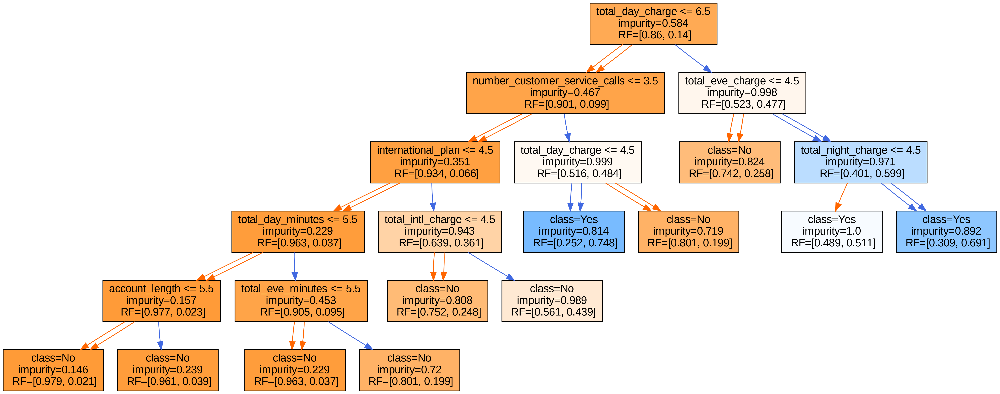

Color Decision Tree saved as 'color_dt.png'


In [77]:
color_dt = colorDT(model=dt, feature_names=feature_names, class_names=class_names)
color_dt.display_color_tree()
color_dt.save_color_tree(output_file='color_dt')

In [78]:
color_dt.display_rules(X_train, y_train)


Rules:
Rule (Type 1)
Original Rule:
IF total_day_charge <= 6.5 and number_customer_service_calls <= 3.5 and international_plan <= 4.5 and total_day_minutes <= 5.5 and account_length <= 5.5 THEN class = No (RF: 0.979)
Compact Rule:
IF total_day_charge <= 6.5 and number_customer_service_calls <= 3.5 and international_plan <= 4.5 and total_day_minutes <= 5.5 and account_length <= 5.5 THEN class = No (RF: 0.979)

Rule (Type 2)
Original Rule:
IF total_day_charge <= 6.5 and number_customer_service_calls <= 3.5 and international_plan <= 4.5 and total_day_minutes <= 5.5 and account_length > 5.5 THEN class = No (RF: 0.961)
Compact Rule (Method 1 - Full path IR Removal):
IF total_day_charge <= 6.5 and number_customer_service_calls <= 3.5 and international_plan <= 4.5 and total_day_minutes <= 5.5 THEN class = No (RF: 0.977)
Compact Rule (Method 2 - Max RF node-based IR Removal):
IF total_day_charge <= 6.5 and number_customer_service_calls <= 3.5 and international_plan <= 4.5 and total_day_minute

### **2) RF Table**

In [79]:
epsilon=0.07
color_dt.type_rf_table(epsilon)

,Rule Count,RF Diff < Epsilon,Ratio
Rule Type,,,
Type 1-n,2.00000000000000000000,2.00000000000000000000,1.00000000000000000000
Type 1-y,2.00000000000000000000,2.00000000000000000000,1.00000000000000000000
Type 2-m1,7.00000000000000000000,1.00000000000000000000,0.14000000000000001332
Type 2-m2-n,7.00000000000000000000,7.00000000000000000000,1.00000000000000000000
Type 2-m2-y,NaN,NaN,NaN


In [80]:
# Define the parameters
epsilon = 0.07
num_iterations = 30 # 최소 10번 이상

summary_tables = []
for _ in range(num_iterations):
    X_train, _, y_train, _ = train_test_split(X, y, test_size=0.2)
    dt = DecisionTreeClassifier(criterion='entropy', min_samples_leaf=0.03)
    dt.fit(X_train, y_train)

    color_dt = colorDT(model=dt, feature_names=feature_names, class_names=class_names)
    color_dt.classify_rules(X_train, y_train)

    type_rf_table = color_dt.type_rf_table(epsilon)
    summary_tables.append(type_rf_table)

combined_summary_table = pd.concat(summary_tables)
averaged_summary_table = combined_summary_table.groupby(combined_summary_table.index).mean()
averaged_summary_table.round(3)

,Rule Count,RF Diff < Epsilon,Ratio
Rule Type,,,
Type 1-n,2.00000000000000000000,2.00000000000000000000,1.00000000000000000000
Type 1-y,6.90000000000000035527,6.86699999999999999289,0.99599999999999999645
Type 2-m1,15.63299999999999911893,9.73300000000000054001,0.61899999999999999467
Type 2-m2-n,12.46700000000000052580,12.46700000000000052580,1.00000000000000000000
Type 2-m2-y,3.51900000000000012790,3.51900000000000012790,1.00000000000000000000


### **3) Pruning**

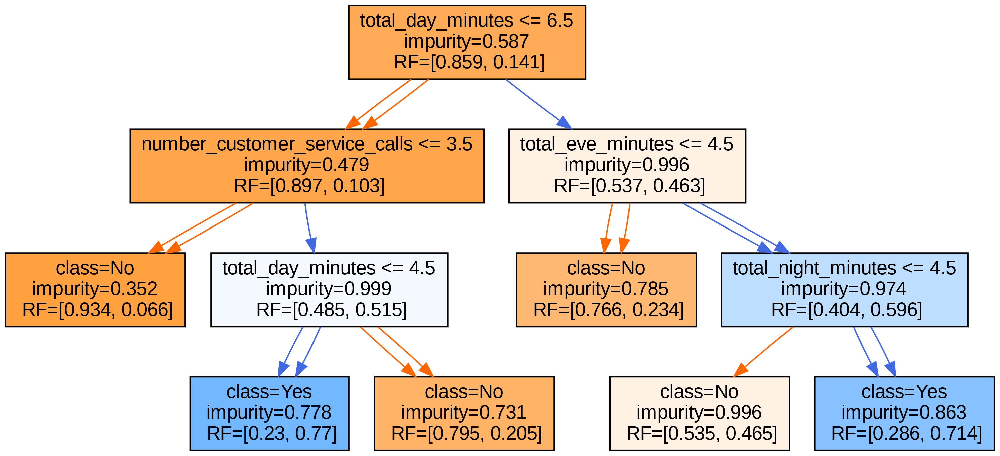

Pruned Color Decision Tree saved as 'color_dt_pruned.png'


In [81]:
color_dt = colorDT(model=dt, feature_names=feature_names, class_names=class_names)
color_dt.display_color_tree_pruned()
color_dt.save_color_tree_pruned(output_file='color_dt_pruned')

In [82]:
color_dt.display_rules(X_train, y_train)


Rules:
Rule (Type 1)
Original Rule:
IF total_day_minutes <= 6.5 and number_customer_service_calls <= 3.5 THEN class = No (RF: 0.934)
Compact Rule:
IF total_day_minutes <= 6.5 and number_customer_service_calls <= 3.5 THEN class = No (RF: 0.934)

Rule (Type 1)
Original Rule:
IF total_day_minutes <= 6.5 and number_customer_service_calls > 3.5 and total_day_minutes <= 4.5 THEN class = Yes (RF: 0.77)
Compact Rule:
IF number_customer_service_calls > 3.5 and total_day_minutes <= 4.5 THEN class = Yes (RF: 0.77)

Rule (Type 2)
Original Rule:
IF total_day_minutes <= 6.5 and number_customer_service_calls > 3.5 and total_day_minutes > 4.5 THEN class = No (RF: 0.795)
Compact Rule (Method 1 - Full path IR Removal):
IF total_day_minutes <= 6.5 and total_day_minutes > 4.5 THEN class = No (RF: 0.912)
Compact Rule (Method 2 - Max RF node-based IR Removal):
IF total_day_minutes <= 6.5 and number_customer_service_calls > 3.5 and total_day_minutes > 4.5 THEN class = No (RF: 0.795)

Rule (Type 2)
Original 